In [111]:
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np #Library for numerical calculations
from scipy import stats #Library for statistical analysis 
import pandas as pd
import warnings
from scipy.stats.mstats import gmean
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn
import os

In [139]:
#Utilization classes for array transformations and operations

class ArrayTransformator:
    
    
    def summarize_element(array,metric,index):
        """
        Summarizes a given row from the array represented by the index. The summarization is done according to 
        the provided metric
        
        Input
        -----
        array : ndarray
        metric : str: ('avg','max','median','min')
        index : int, index of row
        
        Returns
        -----
        The corresponding summarization as a scalar
        """
        vector = array[index]
            
        if metric=="avg":
            return np.mean(vector)
        elif metric=='max':
            return np.max(vector)
        elif metric=='median':
            return np.median(vector)
        elif metric=='min':
            return np.min(vector)
        else:
            print("Invalid metric. Try (avg,max,median,min).")
            
    
    def summarize_subarray(array,metric,columns):
        """
        Summarizes a given subarray from the array by the given metric, where a subarray defines a 2d slice of 
        the array defined by columns
        
        Input
        -----
        array : ndarray
        metric : str: ('avg','max','median','min')
        columns : list(int)
        
        Returns
        -----
        The corresponding summarization as a scalar
        """
        subarray = array[:,columns]
            
        if metric=="avg":
            return np.mean(subarray)
        elif metric=='max':
            return np.max(subarray)
        elif metric=='median':
            return np.median(subarray)
        elif metric=='min':
            return np.min(subarray)
        else:
            print("Invalid metric. Try (avg,max,median,min).")

In [151]:
#Utilization class for siot visualizations

class Visualizer:
    
    
    def __init__(self, siot):
        """
        Constructor. Initiatializes the siot 
        """
        self.siot = siot
        self.sector_short_names = list(map(lambda x:' '.join(x.split(' ')[:8]),self.siot.sectors))

    
    def visualize_links_sensitivity(self,metrics,matrix='L'):
        """
        Visualizes each link pair sensitivity with a heatmap from the provided matrix using the provided metrics

        Parameters
        -----
        metrics : list of metrics to use, list of str
        matrix : the matrix type (L,G)
        """
        # Summarizing each sensitivity by some metric, like average or max or min ... Visualization of the matrix sensitivities
        # The summarized Sensitivities of the L links calculates the vectorized form of the sensitivities for each link,
        # where each link is represented by a n_sectors*n_sectors matrix. Afterwards we summarize each of this matrices by
        # using some metric as below

        sens_matrices = []

        for metric in metrics:
            if matrix=='L':
                sens_matrices.append(self.siot.get_Summarized_Link_Sensitivites(metric))
            else:
                sens_matrices.append(self.siot.get_Summarized_Link_Sensitivites(metric,'G'))

        # Now for sector i and sector j, the corresponding summarized derivative for the i,j element in the matrix
        # is equivalent to the element in the position n_sectors*(i-1)+j, meaning if we reshape the vectors of summarizations
        # to (n_sectors,n_sectors) shape the (i,j) element will tell us the summarized sensitivity of each link.

        # After this each variable is a matrix where (i,j) element is the summarized sensitivity by the suitable metric for
        # the link between sector i and sector j in the input net(A/B) accordingly
        
        # We can now draw a heat map for each metric to see how each link is characterized

        for index,sens in enumerate(sens_matrices):
            plt.figure(figsize=(15,10))
            plt.title("Heatmap for the "+matrix+" matrix with "+str(metrics[index])+" summarization per sector pair")
            sns.heatmap(sens,cmap='inferno',
                       xticklabels=self.sector_short_names, yticklabels=self.sector_short_names)
            plt.show()
            
    
    def visualize_sectors_sensitivity(self,metrics,matrix='L',type_input=True):
        """
        Visualizes each sector sensitivity using a barplot and a scatterplot where the sector is treated defined by
        the type_input parametar and the sensitivities are calculated using the provided matrix

        Parameters
        -----
        metrics : list of metrics to use, list of str
        matrix : the matrix type (L,G)
        type_input : defining whether the sector should be treated as an input or output, bool
        """
        #Getting separate sensitivities for each sector 
        sens_sectors = []
        
        for metric in metrics:
            if matrix=='L':
                if type_input==True:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'L',True))
                else:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'L',False))
            else:
                if type_input==True:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'G',True))
                else:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'G',False))
                    
        for index,metric in enumerate(metrics):
            sens = pd.DataFrame()
            sens['Sectors'] = self.sector_short_names
            col_name = metric+" Sensitivity "
            sens[col_name] = sens_sectors[index]
            plt.figure(figsize=(25,10))
            plt.subplot(1,2,1)
            sns.barplot(x='Sectors',y=col_name,data=sens)
            plt.xlabel("Sectors")

            if type_input==True:
                plt.ylabel("Input sensitivities for "+metric+" summarization")
            else:
                plt.ylabel("Output sensitivities for "+metric+" summarization")

            plt.title("Plot of sectors per sensitivity("+matrix+") for "+metric)
            plt.xticks(rotation='vertical')
            
            plt.subplot(1,2,2)
            ax = plt.scatter(x='Sectors',y=col_name,data=sens)
            plt.xlabel("Sectors")
            if type_input==True:
                plt.ylabel("Input sensitivities for "+metric+" summarization")
            else:
                plt.ylabel("Output sensitivities for "+metric+" summarization")
                
            plt.title("Plot of sectors per sensitivity("+matrix+") for "+metric)
            plt.xticks(rotation='vertical')
            
            plt.show()
            
        
    def visualize_describe_top_k_sorted_links_sensitivity(self,metrics,k,matrix='L',asc=False):
        """
        Visualizes and describes top k links sensitivity using a barplot derived from the provided matrix. 
        Previously sorts all links defined by the sorting criteria

        Parameters
        -----
        metrics : list of metrics to use, list of str
        k : number of links to visualize
        matrix : the matrix type (L,G)
        asc : defines the sort order, If true, then the sorting is done in ascending order, bool 
        """
        # Sorting the lists in provided order by the sensitivity to visualize most sensitive links, 
        # input and output sectors
        sens_matrices = []

        for metric in metrics:
            if matrix=='L':
                sens_matrices.append(self.siot.get_Summarized_Link_Sensitivites(metric))
            else:
                sens_matrices.append(self.siot.get_Summarized_Link_Sensitivites(metric,'G'))
                
        links_dictionaries={}
        for index,metric in enumerate(metrics):
            links_dict = {}
            for sec_out in range(self.siot.num_sectors):
                for sec_in in range(self.siot.num_sectors):
                    key = self.sector_short_names[sec_out]+" AND "+self.sector_short_names[sec_in]
                    links_dict[key] = sens_matrices[index][sec_out,sec_in]

            if asc==True:        
                links_dictionaries[metric] = {k: v for k, v in sorted(links_dict.items(), key=lambda item: item[1])}
            else:
                links_dictionaries[metric] = {k: v for k, v in sorted(links_dict.items(), key=lambda item: -item[1])}
                
        print("Summary of the sorted links for the "+matrix+" matrix: \n\n")
        for metric in metrics:
            print("Top "+str(k)+" links with ",metric," summarization metric:")
            print("===================================================")    
            rank = 1
            for sector_pair,sens in list(links_dictionaries[metric].items())[:k]:
                print(rank, ". Sector pair: ",sector_pair," : ",sens)
                rank = rank + 1

            print("===================================================\n\n")
    
      
        for metric in metrics:
            df = pd.DataFrame()
            items = list(links_dictionaries[metric].items())[:k]
            unzipped_items =list(map(list, zip(*items)))
            df['Link pairs'] = unzipped_items[0]
            col_name = 'Sensitivities by '+metric
            df[col_name] = unzipped_items[1]
            plt.figure(figsize=(15,10))
            sns.barplot(x='Link pairs',y=col_name,data=df)
            plt.xlabel("Links")
            plt.ylabel("Sensitivities for "+metric+" summarization")
            plt.title("Plot of links per sensitivity("+matrix+") for "+metric)
            plt.xticks(rotation='vertical')
            plt.show()
    
    
    def visualize_describe_top_k_sorted_sectors_sensitivity(self,metrics,k,matrix='L',type_input=True,asc=False):
        """
        Visualizes and describes top k sectors sensitivity using a barplot where the sector is treated defined by
        the type_input parametar and the sensitivities are calculated using the provided matrix. Previously sorts
        all sectors defined by the sorting criteria

        Parameters
        -----
        metrics : list of metrics to use, list of str
        k : number of sectors to visualized
        matrix : the matrix type (L,G)
        type_input : defines whether to treat the sectro as an input, bool
        asc : defines the sort order, If true, then the sorting is done in ascending order, bool 
        """
        
        #Getting separate sensitivities for each sector 
        sens_sectors = []
        
        for metric in metrics:
            if matrix=='L':
                if type_input==True:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'L',True))
                else:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'L',False))
            else:
                if type_input==True:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'G',True))
                else:
                    sens_sectors.append(self.siot.get_Summarized_Sensitivities_For_Sectors(metric,'G',False))
                    
        if type_input:
            print("Sensitivities for input sectors: ")
        else:
            print("Sensitivities for output sectors: ")
        
        print("Derived from matrix: ",matrix)
        sectors_dictionaries={}
        for index,metric in enumerate(metrics):
            sensors_dict = {}
            for sec in range(self.siot.num_sectors):
                key = self.sector_short_names[sec]
                sensors_dict[key] = sens_sectors[index][sec]

            if asc==True:
                sectors_dictionaries[metric] = {k: v for k, v in sorted(sensors_dict.items(), key=lambda item: item[1])}
            else:
                sectors_dictionaries[metric] = {k: v for k, v in sorted(sensors_dict.items(), key=lambda item: -item[1])}
                
        
        for metric in metrics:
            print("\n\nTop "+str(k)+" sectors with ",metric," summarization metric:")
            print("===================================================")    
            rank = 1
            for sector,sens in list(sectors_dictionaries[metric].items())[:k]:
                print(rank, ". Sector: ",sector," : ",sens)
                rank = rank + 1

            print("===================================================\n\n")    

        for metric in metrics:
            df = pd.DataFrame()
            items = list(sectors_dictionaries[metric].items())[:k]
            unzipped_items =list(map(list, zip(*items)))
            df['Sectors'] = unzipped_items[0]
            col_name = 'Sensitivities by '+metric
            df[col_name] = unzipped_items[1]
            plt.figure(figsize=(25,10))
            sns.barplot(x='Sectors',y=col_name,data=df)
            plt.xlabel("Sectors")
            plt.ylabel("Sensitivities for "+metric+" summarization")
            plt.title("Plot of sectors per sensitivity("+str(matrix)+") for "+metric)
            plt.xticks(rotation='vertical')
            plt.show()    
            
            
    def visualize_describe_link_global_shock_effect_and_top_k(self, columns, k=10, epsilon=None, disturbance_factor=None):
        """
        Visualizes and describes how post-shock each link will affect the overall economy by using its p-multiplier 
        value 

        Input : 
        columns : list of strings, columns to use for the calculation of the beta vector
        epsilion : logarithm of the Hicks neutral productivity shock set to 1 if default(ignored for now)
        disturbance_factor : vector of disturbances per link in the A matrix
        k : top k most impactful shock inducing links(in both positive and negative sense) to visualize, int 
        
        """
        post_shock_multipliers = self.siot.get_summarized_shock_P_geo_mean(columns,epsilon,disturbance_factor)
        # Now the matrix post_shock_multipliers contains a summarized impact each link between sectors has on the 
        # overall GDP. We can order each link by its difference from p=1 (which represents stable GDP). 
        # Positive differences infer links in which if a shock occurs it would induce an increase in the GDP, and 
        # negative differences infer links in which if a shock occurs it would induce a decrease in the GDP. 
        # The change induced by the shock in link u,v is calculated as P[u,v] - 1.
        
        plt.figure(figsize=(15,10))
        plt.title("Heatmap for the Post shock multipliers link matrix")
        sns.heatmap(post_shock_multipliers,cmap='inferno',
                   xticklabels=self.sector_short_names, yticklabels=self.sector_short_names)
        plt.show()
        
        # We will also visualise the top k positive and negative shock inducing links
        distance_matrix = post_shock_multipliers-np.ones((self.siot.num_sectors,self.siot.num_sectors))
        distance_dictionary = {(i,j):distance_matrix[i,j] 
                              for i in range(self.siot.num_sectors) for j in range(self.siot.num_sectors)}
        take_sectors = k
        sorted_dictionary = {k:v for k,v in sorted(distance_dictionary.items(), key=lambda item: -item[1])}
        top_k_positive = list({self.sector_short_names[key[0]]+" : "+self.sector_short_names[key[1]]:post_shock_multipliers[key[0],key[1]] for key,val in 
                  sorted_dictionary.items() if val>0}.items())[:k]
        top_k_negative = list({self.sector_short_names[key[0]]+" : "+self.sector_short_names[key[1]]:post_shock_multipliers[key[0],key[1]] for key,val in 
                  sorted_dictionary.items() if val<0}.items())[-k:]
        
        if len(top_k_positive)!=0:
            print("Top ten positive links: ")
            print("====================================================")
            for key,val in top_k_positive:
                print("Sector link shock importance: ",key," = ",val)
            df = pd.DataFrame()
            unzipped_items =list(map(list, zip(*top_k_positive)))
            df['Links'] = unzipped_items[0]
            col_name = 'P multipliers'
            df[col_name] = unzipped_items[1]
            plt.figure(figsize=(15,10))
            sns.barplot(x='Links',y=col_name,data=df)
            plt.xlabel("Links")
            plt.ylabel("P multipliers")
            plt.title("Plot of top increasing(>1) p multipliers per link")
            plt.xticks(rotation='vertical')
            plt.show()   
            
        else:
            print("No links with p>1 values!")
            
        print("\n\n\n")
        if len(top_k_negative)!=0:
            print("Top ten negative links: ")
            print("====================================================")
            for key,val in top_k_negative:
                print("Sector link shock importance: ",key," = ",val)
            df = pd.DataFrame()
            unzipped_items =list(map(list, zip(*top_k_negative)))
            df['Links'] = unzipped_items[0]
            col_name = 'P multipliers'
            df[col_name] = unzipped_items[1]
            plt.figure(figsize=(15,10))
            sns.barplot(x='Links',y=col_name,data=df)
            plt.xlabel("Links")
            plt.ylabel("P multipliers")
            plt.title("Plot of top decreasing(<1) p multipliers per link")
            plt.xticks(rotation='vertical')
            plt.show() 
        else:
            print("No links with p<1 values!")
            
            
    def visualize_describe_global_shock_effect_sectors_top_k(self, columns, k=10, epsilon=None, 
                                                             disturbance_factor=None, type_input=True):
        """
        Visualizes and describes how post-shock each sector will affect the overall economy by using its p-multiplier 
        value. Also the sector is treated as an input or output sector according to the provided argument

        Input : 
        columns : list of strings, columns to use for the calculation of the beta vector
        epsilion : logarithm of the Hicks neutral productivity shock set to 1 if default(ignored for now)
        disturbance_factor : vector of disturbances per link in the A matrix
        k : top k most impactful shock inducing links(in both positive and negative sense) to visualize, int 
        type_input : whether the sector should be treated as input or not, bool
        
        """
        post_shock_multipliers = self.siot.get_summarized_shock_P_geo_mean(columns,epsilon,disturbance_factor)
        if type_input:
            # For each sector, we will calculate a mean of its corresponding row in the post_shock_multipliers matrix
            shock_multipliers = np.array([np.mean(row) for row in post_shock_multipliers])
        else:
            # For each sector, we will calculate a mean of its corresponding column in the post_shock_multipliers matrix
            shock_multipliers = np.array([np.mean(row) for row in post_shock_multipliers.T])

        distance_vector = np.ones((self.siot.num_sectors))-shock_multipliers
        distance_dictionary = {i:distance_vector[i] 
                              for i in range(self.siot.num_sectors)}
        sorted_dictionary = {k:v for k,v in sorted(distance_dictionary.items(), key=lambda item: item[1])}

        top_positive = list({self.sector_short_names[key]:shock_multipliers[key] for key,_ in 
                  sorted_dictionary.items() if shock_multipliers[key]>1}.items())[:k]

        top_negative = (list({self.sector_short_names[key]:shock_multipliers[key] for key,_ in 
                  sorted_dictionary.items() if shock_multipliers[key]<1}.items())[-k:])
        top_negative.reverse()

        min_val = np.min(shock_multipliers)
        max_val = np.max(shock_multipliers)
        high_percentile = np.quantile(shock_multipliers,0.8)
        low_percentile = np.quantile(shock_multipliers,0.2)

        delta = 1e-12
        if type_input:
            col_name = 'Input sector shock impact'
        else:
            col_name = 'Output sector shock impact'
            
        if len(top_positive) != 0:
            df_pos = pd.DataFrame()
            unzipped_positive_items =list(map(list, zip(*top_positive)))
            df_pos['Sectors'] = unzipped_positive_items[0]
            df_pos[col_name] = unzipped_positive_items[1]
            plt.figure(figsize=(15,10))
            sns.barplot(x='Sectors',y=col_name,data=df_pos)
            plt.xlabel("Sectors")
            plt.ylabel("Shock impact, p multiplier")
            if type_input:
                plt.title("Plot of input sectors for top k(max) positive shock impacts")
            else:
                plt.title("Plot of output sectors for top k(max) positive shock impacts")
            plt.xticks(rotation='vertical')
            plt.ylim(high_percentile-delta, max_val+delta)
            plt.show()
            print("Top positive sector shocks: ")
            print("====================================================")
            for key,val in top_positive:
                print("Sector shock importance: ",key," = ",val)
            print("\n\n\n")
        else:
            print("No sectors with positive p multiplier!")

        if len(top_negative)!=0:
            df_neg = pd.DataFrame()
            unzipped_negative_items =list(map(list, zip(*top_negative)))
            df_neg['Sectors'] = unzipped_negative_items[0]
            df_neg[col_name] = unzipped_negative_items[1]
            plt.figure(figsize=(15,10))
            sns.barplot(x='Sectors',y=col_name,data=df_neg)
            plt.xlabel("Sectors")
            plt.ylabel("Shock impact, p multiplier")
            if type_input:
                plt.title("Plot of input sectors for top k(max) negative shock impacts")
            else:
                plt.title("Plot of output sectors for top k(max) negative shock impacts")
            plt.xticks(rotation='vertical')
            plt.ylim(min_val-delta, low_percentile+delta)
            plt.show()
            print("Top negative sector shocks: ")
            print("====================================================")
            for key,val in top_negative:
                print("Sector shock importance: ",key," = ",val)
        else:
            print("No sectors with negative p multiplier!")
            
            
    def visualize_describe_top_k_sectors_affection_from_C(self, columns, k=3):
        """
        Visualizes and describes the top_k affected sectors by the post-shock of each sector separately. More precisely,
        for a shock induced in every sector i, we find the top k sectors affected by it, for each sector.
        
        Input : 
        columns : list of strings, columns to use for the calculation of the beta vector
        k : number of sectors to take as top
        
        """
        C = self.siot.get_C_matrix(columns)
        top_affected_sectors = np.array([row.argsort()[-k:][::-1] for row in C])
        print("C matrix analysis: ")
        for sector_i in range(self.siot.num_sectors):
            print("===============================================")
            print("Sector: ",self.siot.sectors[sector_i]," affects these 3 sectors the most: ")
            for counter in range(k):
                print("\t Sector: ",self.siot.sectors[top_affected_sectors[sector_i,counter]]," with value: ",
                      C[sector_i,top_affected_sectors[sector_i,counter]])
            print("===============================================")
            
        sector_affection_dict = {}
        for sector_affection_row in top_affected_sectors:
            for sector_no in range(k):
                if sector_affection_row[sector_no] in sector_affection_dict:
                    sector_affection_dict[sector_affection_row[sector_no]] = sector_affection_dict[sector_affection_row[sector_no]]+1
                else:
                    sector_affection_dict[sector_affection_row[sector_no]] = 1

        sorted_dict = {k:v for k,v in sorted(sector_affection_dict.items(), key=lambda item: -item[1])}
        for sector_no,value in sorted_dict.items():
            print("Sector: ",self.siot.sectors[sector_no]," appeared ",value," times as top ",top_k,"!")

        total_count = np.sum(list(sorted_dict.values()))
        items = (list({self.sector_short_names[k]:np.round((v*100/total_count),3) for k,v in sorted_dict.items()}.items()))
        df = pd.DataFrame()
        unzipped_items =list(map(list, zip(*items)))
        df['Sectors'] = unzipped_items[0]
        col_name="Percentage"
        df[col_name] = unzipped_items[1]
        plt.figure(figsize=(15,10))
        sns.barplot(x='Sectors',y=col_name,data=df)
        plt.xlabel("Sectors")
        plt.ylabel("Percentage that the sector appeared as top k")
        plt.title("Plot of percentages of appearence of sectors as top k affected")
        plt.xticks(rotation='vertical')
        plt.show()


In [141]:
#Utilization class for pipeline processing of datasets

class PipelineProcessor:
    # Pipeline to instatiate objects from all years for the SIOT table class

    def get_datasets(data_dir):
        """
        Get all .xls filenames from the specified directory

        Parameters
        -----
        data_dir : path to directory containing .xls files

        Returns
        -----
        ret : list containing dataset filenames
        """

        return [f for f in os.listdir(data_dir) if os.path.isfile(
            os.path.join(data_dir, f)) and f.endswith(".xls")]   


    def run_siot_analysis(input_dir):
        """
        Iterate over the input datasets and process them, creating objects of type SiotTable

        Parameters
        -----
        input_dir : path to directory containing tables in xls format

        Returns
        -----
        ret : list of created SiotTable objects

        """

        tables = sorted(PipelineProcessor.get_datasets(input_dir))
        table_objects = []

        for table in tables:
            year = table.split('_')[0]
            print("Processing SIOT table for Macedonia for year {}...".format(year))
            print("Creating object..")
            path = os.path.join(input_dir,table)
            table_obj = SiotTable(path)
            table_objects.append(table_obj)

        return table_objects

In [181]:
#Class representing the SIOT table for Macedonia for a certain year

class SiotTable:
    
    
    def __init__(self, file):
        """
        Constructor. Initiatializes the siot from the given file
        """
        self.file = file
        # Filling all nan entries with 0s
        self.siot = pd.read_excel(file).fillna(0)
        # Getting the first non-sector index
        self.non_sector_index = list(self.siot.columns.values).index("Вкупна меѓуфазна потрошувачка "
        +"по основни цени/ Total intermediate consumption at basic prices")
        # Getting all indices of non zero x rows
        self.non_zero_ind = np.nonzero(self.siot.iloc[:self.non_sector_index-1,-1].values)[0]
        self.num_sectors = len(self.non_zero_ind)
        self.sectors = list(self.siot.iloc[self.non_zero_ind,self.non_zero_ind].columns.values)
        
        
    def get_index_by_sector_name(self,sector_name):
        """
        Returns the index of the sector for a given sector name

        Input
        -----
        sector_name : str, the sector name
        
        Returns
        -----
        index : int
        
        """
        return self.sectors.index(sector_name)
    
    
    def get_Z_matrix(self):
        """
        Calculates the Z matrix for the table passed to the constructor

        Returns
        -----
        Z_matrix : ndarray, shape: (n_sectors,n_sectors)
        
        """
        Z_matrix = self.siot.iloc[self.non_zero_ind,self.non_zero_ind].values
        return Z_matrix
    
    
    def get_X(self):
        """
        Calculates the X vector (total output) for the table passed to the constructor

        Returns
        -----
        X_vector : ndarray, shape:(n_sectors,1)
        
        """
        x = self.siot.iloc[self.non_zero_ind,-1].values
        return x
    
    
    def get_Input_Net_A(self):
        """
        Calculates the input net(matrix) A for the table passed to the constructor

        Returns
        -----
        A : ndarray, shape:(n_sectors,n_sectors)
        
        """
        Z = self.get_Z_matrix()
        x = self.get_X()
        A = (np.array([Z[i,j]/x[j] for i in range(self.num_sectors) for j in range(self.num_sectors)]
                         ).reshape(self.num_sectors,self.num_sectors))
        return A
    
    
    def get_Leontief_Inverse(self):
        """
        Calculates the Leontief-inverse matrix for the A matrix derived from Z and x
        
        Returns
        -----
        L : ndarray, shape:(n_sectors,n_sectors)
        
        """
        A = self.get_Input_Net_A()
        I = np.identity(self.num_sectors)
        L = np.linalg.inv(I-A)
        return L
    
    
    def get_Output_Net_B(self):
        """
        Calculates the output net(matrix) B for the table passed to the constructor

        Returns
        -----
        B : ndarray, shape:(n_sectors,n_sectors)
        
        """
        Z = self.get_Z_matrix()
        x = self.get_X()
        B = (np.array([Z[j,i]/x[j] for i in range(self.num_sectors) for j in range(self.num_sectors)]
                         ).reshape(self.num_sectors,self.num_sectors))
        return B
    
    
    def get_Ghosh_Inverse(self):
        """
        Calculates the Ghosh-inverse matrix for the B matrix derived from Z and x
        
        Returns
        -----
        G : ndarray, shape:(n_sectors,n_sectors)
        
        """
        B = self.get_Output_Net_B()
        I = np.identity(self.num_sectors)
        G = np.linalg.inv(I-B)
        return G
    
    
    def get_Leontief_Sensitivity(self):
        """
        Calculates the Leontief sensitivity matrix Sl. Column u represents the derivative in the i,j position in 
        L matrix where u=i(n_sectors-1)+j 
        
        Returns
        -----
        Sl : ndarray, shape:(n_sectors^2,n_sectors^2)
        
        """
        L = self.get_Leontief_Inverse()
        Sl = np.kron(L.T,L)
        return Sl
    
    
    def get_Ghosh_Sensitivity(self):
        """
        Calculates the Ghosh sensitivity matrix Sg
        
        Returns
        -----
        Sg : ndarray, shape:(n_sectors^2,n_sectors^2)
        
        """
        G = self.get_Ghosh_Inverse()
        Sg = np.kron(G.T,G)
        return Sg
    
    
    def get_Summarized_Link_Sensitivites(self,metric,matrix='L'):
        """
        Calculates a matrix of summarized sensitivities for the provided matrix. The summarization reduces
        the n^2 x n^2 array in an n x n array, where the reduction for each n^2 array is done using the provided metric.
        The summarized sensitivites refer to the links between each pair of sectors.
        
        Input
        -----
        metric : str (avg,max,median)
        matrix : str (L,G) - defines what matrix to use 
        
        Returns
        -----
        summarization : ndarray, shape:(n_sectors,n_sectors)
        
        """
        if matrix=='L':
            S = self.get_Leontief_Sensitivity()
        else:
            S = self.get_Ghosh_Sensitivity()
            
        vec_S = S.T
        #Now we have a list of n_sectors*n_sectors derivatives(sensitivities) where element number n_sectors(i-1)+j 
        #represents he sensitivity of (i,j) element in the matrix (and in turn is a n_sectors*n_sectors matrix itself)
        summarization = np.array([ArrayTransformator.summarize_element(vec_S,metric,i) 
                                  for i in range(self.num_sectors*self.num_sectors)]).reshape(self.num_sectors,self.num_sectors)
        return summarization
        
        
    def get_Summarized_Sensitivities_For_Sector_Pair_By_Name(self,metric,sector_1,sector_2,matrix='L'):
        """
        Calculates the sensitivity of a link between sectors i and j for the Leontief inverse matrix based on a provided
        metric used for reducing
        
        Input
        -----
        metric : str (avg,max,median)
        sector_1,sector_2 : string . The sectors based on their names
        matrix : str (L,G) - defines what matrix to use 
        
        Returns
        -----
        float
        
        """
        i = self.get_index_by_sector_name(sector_1)
        j = self.get_index_by_sector_name(sector_2)
        
        return self.get_Summarized_Sensitivities_For_Sector_Pair_By_Index(metric,i,j,matrix)
        
        
    def get_Summarized_Sensitivities_For_Sector_Pair_By_Index(self,metric,i,j,matrix='L'):
        """
        Calculates the sensitivity of a link between sectors i and j for the Leontief inverse matrix based on a provided
        metric used for reducing
        
        Input
        -----
        metric : str (avg,max,median)
        i,j : int . Indices representing the sector pair (0 based)
        matrix : str (L,G) - defines what matrix to use 
        
        Returns
        -----
        float
        
        """
        if matrix=='L':
            return get_Summarized_Link_Sensitivites(metric)[i,j]
        else:
            return get_Summarized_Link_Sensitivites(metric,'G')[i,j]
    
    
    def get_Summarized_Sensitivities_For_Sectors(self,metric,matrix='L',type_input=True):
        """
        Calculates a summarized sensitivity for each sector(by type) according to some metric from provided matrix
        
        Input
        -----
        metric : str (avg,max,median)
        matrix : str (L,G) - defines what matrix to use
        type_input : bool - defines whether we want to treat the sectors as input or output
        
        Returns
        -----
        summarization : ndarray, shape:(n_sectors)
        
        """
        if matrix=='L':
            S = self.get_Leontief_Sensitivity()
        else:
            S = self.get_Ghosh_Sensitivity()
            
        vec_S = S.T
        new_matrix = np.column_stack(vec_S)
        
        if type_input:
            #Now each N columns can be summarized to define a sensitivity matrix for an input sector where 0:N-1 column 
            #define sector 0...N:2N-1 define sector 1...
            summarization = np.array([ArrayTransformator.summarize_subarray(new_matrix,metric,
                                                                            range(self.num_sectors*i,self.num_sectors*(i+1))) 
                                      for i in range(self.num_sectors)])
        else:
            #Now each N columns can be summarized to define a sensitivity matrix for an output sector where 0,N,...,N^2 
            #column define sector 0..
            summarization = np.array([ArrayTransformator.summarize_subarray(new_matrix,metric,
                                                                            np.arange(i,self.num_sectors*self.num_sectors,self.num_sectors)) 
                                      for i in range(self.num_sectors)])
            
        return summarization
 

    def get_Summarized_Sensitivity_For_Sector_By_Index(self,metric,sector_no,matrix='L',type_input=True):
        """
        Calculates a summarized sensitivity for the sector(by type) with sector_no according to some metric from
        provided matrix
        
        Input : 
        metric : str (avg,max,median)
        sector_no : num of sector (0 based)
        matrix : str (L,G) - defines what matrix to use
        type_input : bool - defines whether we want to treat the sector as input or output
        
        Returns
        -----
        float
        
        """
        if matrix=='L':
            if type_input:
                return self.get_Summarized_Sensitivities_For_Sectors(metric)[sector_no]
            else:
                return self.get_Summarized_Sensitivities_For_Sectors(metric,'L',False)[sector_no]

        else:
            if type_input:
                return self.get_Summarized_Sensitivities_For_Sectors(metric,'G')[sector_no]
            else:
                return self.get_Summarized_Sensitivities_For_Sectors(metric,'G',False)[sector_no]
            
            
    def get_Summarized_Sensitivity_For_Sector_By_Name(self,metric,sector_name,matrix='L',type_input=True):
        """
        Calculates a summarized sensitivity for the sector(by type) with sector_no according to some metric from
        provided matrix
        
        Input : 
        metric : str (avg,max,median)
        sector_name : str, name of the sector
        matrix : str (L,G) - defines what matrix to use
        type_input : bool - defines whether we want to treat the sector as input or output
        
        Returns
        -----
        float
        
        """
        index = self.get_index_by_sector_name(sector_name)
        return self.get_Summarized_Sensitivity_For_Sector_By_Index(metric,index,matrix,type_input)
    
    
    def get_F_vector(self,columns):
        """
        Calculates the f(output) vector for each sector using the provided columns
        
        Input : 
        columns : list of strings, columns to use for the f vector
        
        Returns
        -----
        f : list, vector of gross output per sector
        
        """
        #Calculating f vector for each sector as a sum of the output used as direct goods by the country (by HGI's) 

        # Getting only the slice regarding the f columns from the siot 
        f_slice = self.siot.loc[self.non_zero_ind,f_columns].values
        # Calculating the f vector as a col-sum of the f-slice (each element is a sum of the wanted columns in a single row)
        f = np.sum(f_slice,axis=1)
        # Adding a small constant to every 0 valued f

        epsilon = 1e-10
        f[f==0] = epsilon
        return f
    
    
    def get_Beta_vector(self,columns):
        """
        Calculates the beta(weight) vector for each sector using the provided columns. Each value represents the 
        sector's share in the overall household industry of the country
        
        Input : 
        columns : list of strings, columns to use for the calculation of the f vector
        
        Returns
        -----
        beta : list, vector of weights per sector
        
        """
        f = self.get_F_vector(columns)
        # Estimating beta vector which represents the respective shares of each sector in the overall household 
        # The vector is calculated as f normalized, where the normalization is performed using the sum of f
        beta = f/np.sum(f)
        return beta
    
    
    def get_delta_A_for_shock(self, disturbance_factor=None):
        """
        Induces a shock on the A matrix where the shock is provided by the disturbance_factor
        
        Input : 
        disturbance_factor : vector of disturbances per link in the A matrix
        
        Returns
        -----
        delta_A : the disturbed matrix A, delta A, ndarray shape(num_sectors,num_sectors)
        
        """
        A = self.get_Input_Net_A()
        
        if disturbance_factor is None:
            disturbance_factor=0.01
            return A*disturbance_factor
        
        return np.dot(A.flatten(),disturbance_factor).reshape(self.num_sectors,self.num_sectors)
    
    
    def get_shock_matrix_P(self, columns, epsilon=None, disturbance_factor=None):
        """
        Returns the full shock matrix induced by the shock on the A matrix where the shock is provided by 
        the disturbance_factor. Column i represents a num_sectors^2x1 vector induced by the shock in the sector 
        pair u,v where i=u*(n-1)+v.
        
        Input : 
        columns : list of strings, columns to use for the calculation of the beta vector
        epsilion : logarithm of the Hicks neutral productivity shock set to 1 if default(ignored for now)
        disturbance_factor : vector of disturbances per link in the A matrix
        
        Returns
        -----
        P : the shock matrix, ndarray shape(num_sectors*num_sectors, num_sectrs*num_sectors)
        
        """
        beta = self.get_Beta_vector(columns)
        
        #Concatenating the epsilon vector and the beta vector n times to enable multiplying later
        if epsilon is None:
            epsilon = np.tile(np.ones(self.num_sectors),self.num_sectors)

        beta_v = np.tile(beta,self.num_sectors)

        Sl = self.get_Leontief_Sensitivity()
        delta_A = self.get_delta_A_for_shock(disturbance_factor)
        
        #Calculating dL = dL/dA * dA using np.multiply to multiply each column of the kronecker matrix with the corresponding
        #deltaA element. We also vectorize delta A before to make it a N^2x1 vector. 
        dL = np.multiply(Sl,delta_A.flatten())

        #Now dL is a N^2 x N^2 matrix where N is number of sectors. We multiply it with beta and epsilon in the same way
        P = np.multiply(np.multiply(dL,beta_v),epsilon)
        return np.exp(P)
    
    
    def get_summarized_shock_P_geo_mean(self, columns, epsilon=None, disturbance_factor=None):
        """
        Returns a summarized shock matrix induced by the shock on the A matrix where the shock is provided by 
        the disturbance_factor. Element i,j represents a summarized geometric mean value of the impact the shock had
        on this link
        
        Input : 
        columns : list of strings, columns to use for the calculation of the beta vector
        epsilion : logarithm of the Hicks neutral productivity shock set to 1 if default(ignored for now)
        disturbance_factor : vector of disturbances per link in the A matrix
        
        Returns
        -----
        P_sum : the summarized geometric mean shock matrix, ndarray shape(num_sectors, num_sectors)
        
        """
        P = self.get_shock_matrix_P(columns,epsilon,disturbance_factor)
        # Next, we want to calculate a geometric mean of each of the columns of the P matrix in order to get a 
        # summarized impact of the shock in link (u,v) throughout the whole economy(GDP multiplier) according to 
        # equation (26). We also reshape the vector as an num_sectors x num_sectors matrix. 

        post_shock_multipliers =  np.array([gmean(row) for row in P.T]).reshape(self.num_sectors,self.num_sectors)
        return post_shock_multipliers
    
    
    def get_C_matrix(self, columns):
        """
        Calculates the C matrix where the i-th row represents i-th sector's post- shock affection on all the other sectors.
        Similar to the p multiplier and P matrix. Here we don't need to know the shock ammount and the noise
        
        Input : 
        columns : list of strings, columns to use for the calculation of the beta vector
        
        Returns
        -----
        C : the C matrix, ndarray shape(num_sectors, num_sectors)
        
        """
        # Calculating the C matrix which will represent a somewhat normalized version of p excluding
        # the shock and the noise (both are nullified)

        L = self.get_Leontief_Inverse()
        beta = self.get_Beta_vector(columns)
        C = np.array([(L[j,u]*beta[j])/(L[u,u]*beta[u]) 
                      for u in range(self.num_sectors) 
                      for j in range(self.num_sectors)]).reshape(self.num_sectors,self.num_sectors)
        return C

In [182]:
# Running full pipeline to create every siot object
table_objects = PipelineProcessor.run_siot_analysis("SIOT/data/tables")

Processing SIOT table for Macedonia for year 2005...
Creating object..
Processing SIOT table for Macedonia for year 2010...
Creating object..
Processing SIOT table for Macedonia for year 2015...
Creating object..


#### From now on, I will only work on the 2015 dataset for Macedonia which includes 63 total sectors

In [183]:
# Acquiring the table for year 2015
latest_table = table_objects[-1]
# Getting all representative measures
Z = latest_table.get_Z_matrix()
x = latest_table.get_X()
A = latest_table.get_Input_Net_A()
L = latest_table.get_Leontief_Inverse()
B = latest_table.get_Output_Net_B()
G = latest_table.get_Ghosh_Inverse()
Sl = latest_table.get_Leontief_Sensitivity()
Sg = latest_table.get_Ghosh_Sensitivity()

In [184]:
# Creating a visualizer object
visualizer = Visualizer(latest_table)
metrics=['max','median','avg']

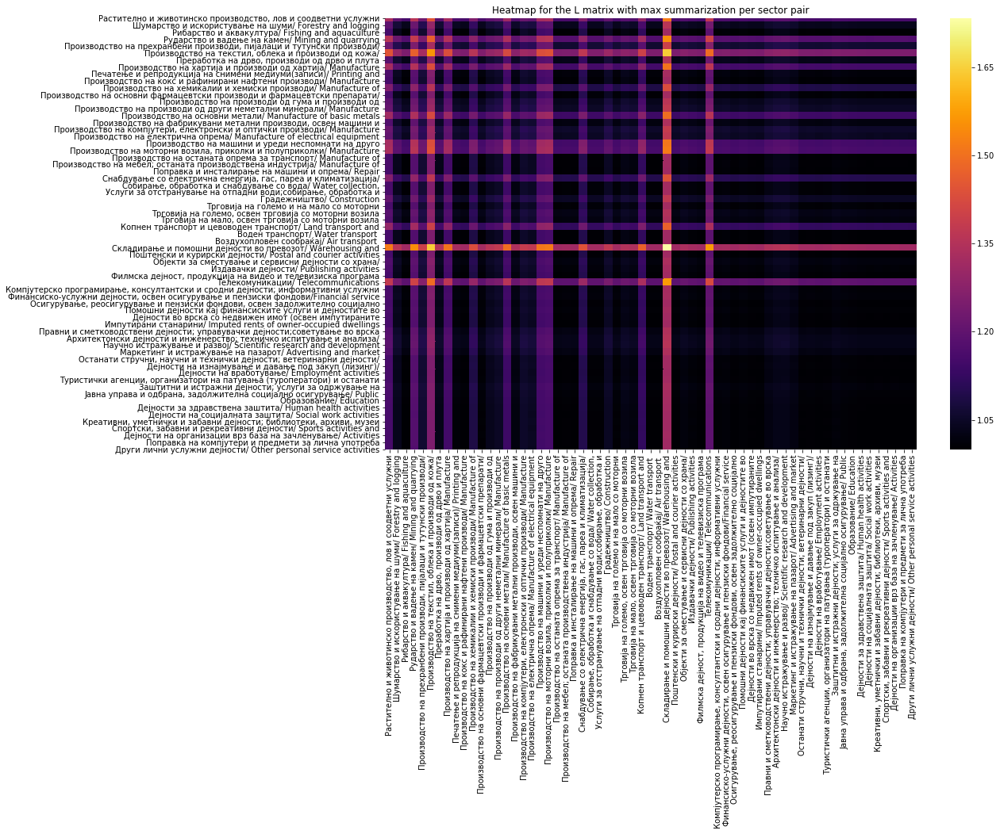

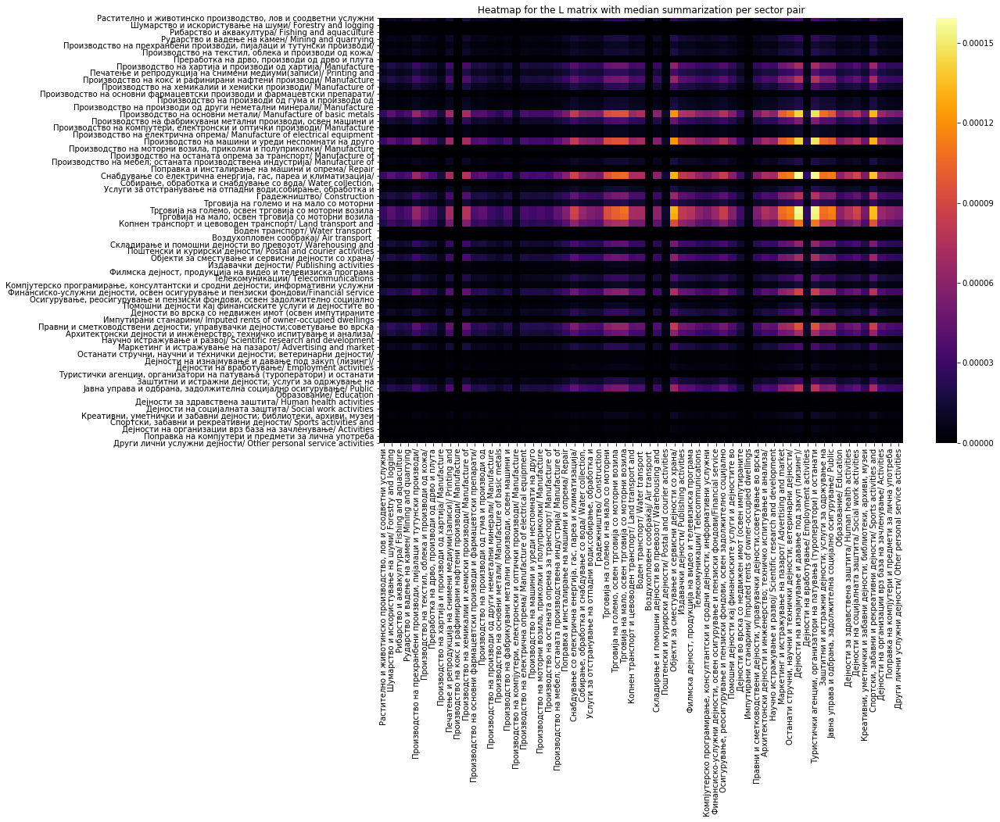

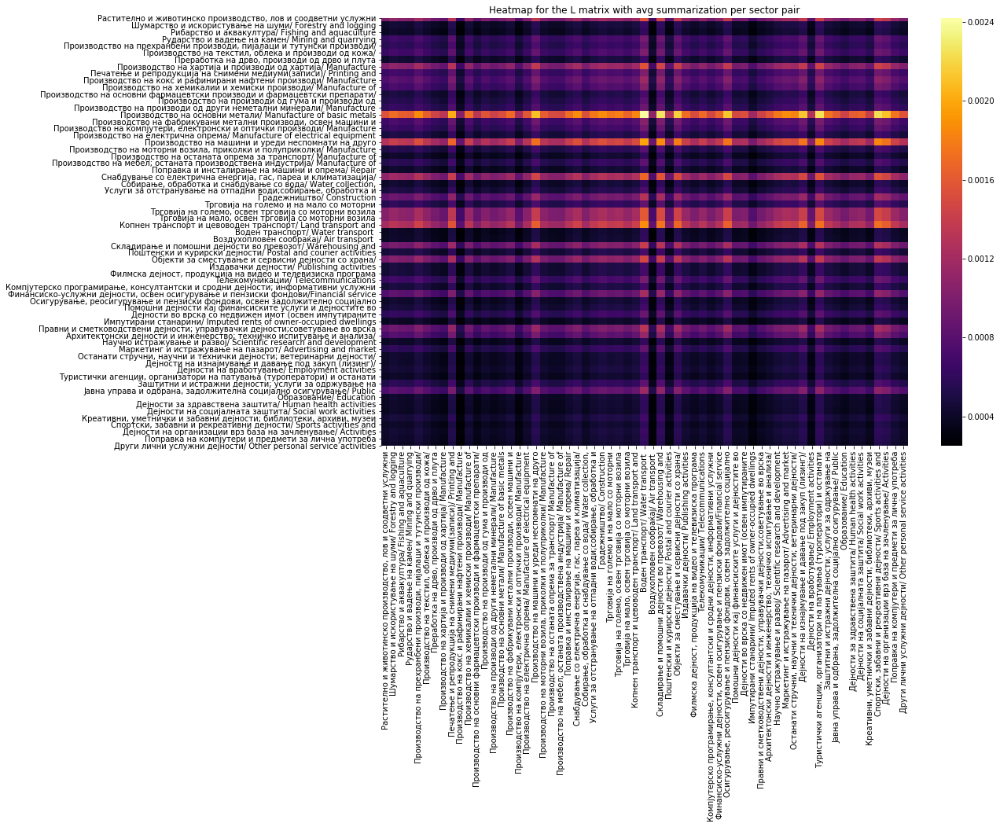

In [119]:
# Visualizing link sensitivities for matrix L 
visualizer.visualize_links_sensitivity(metrics,'L')

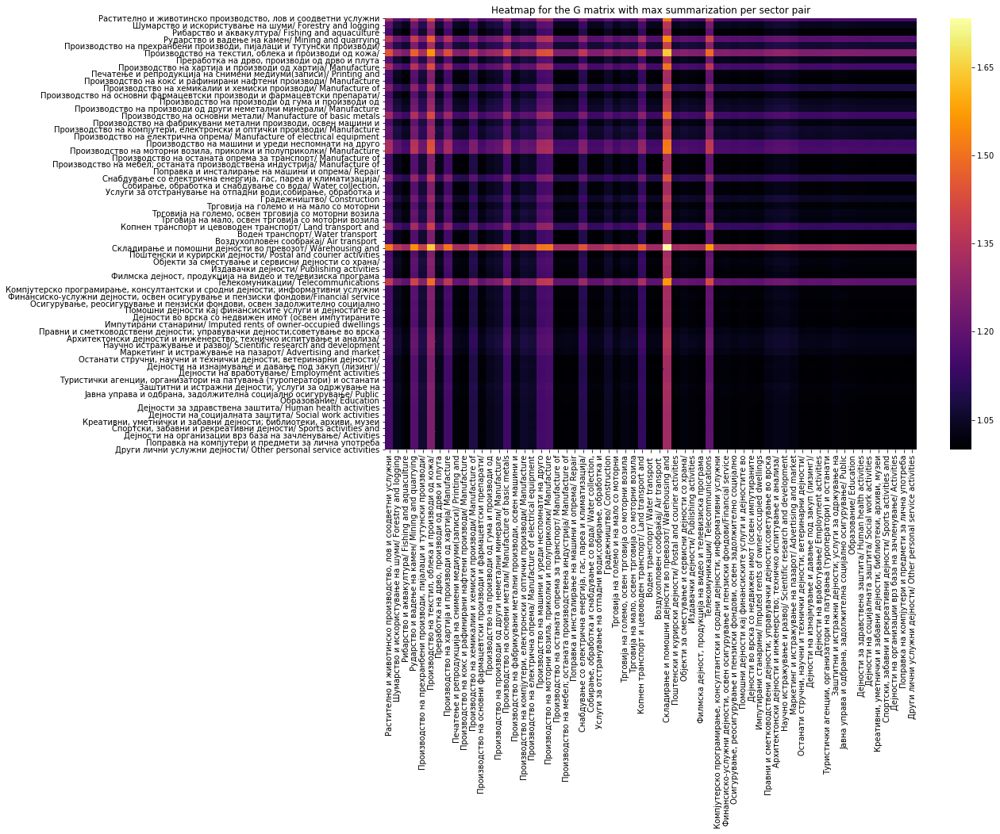

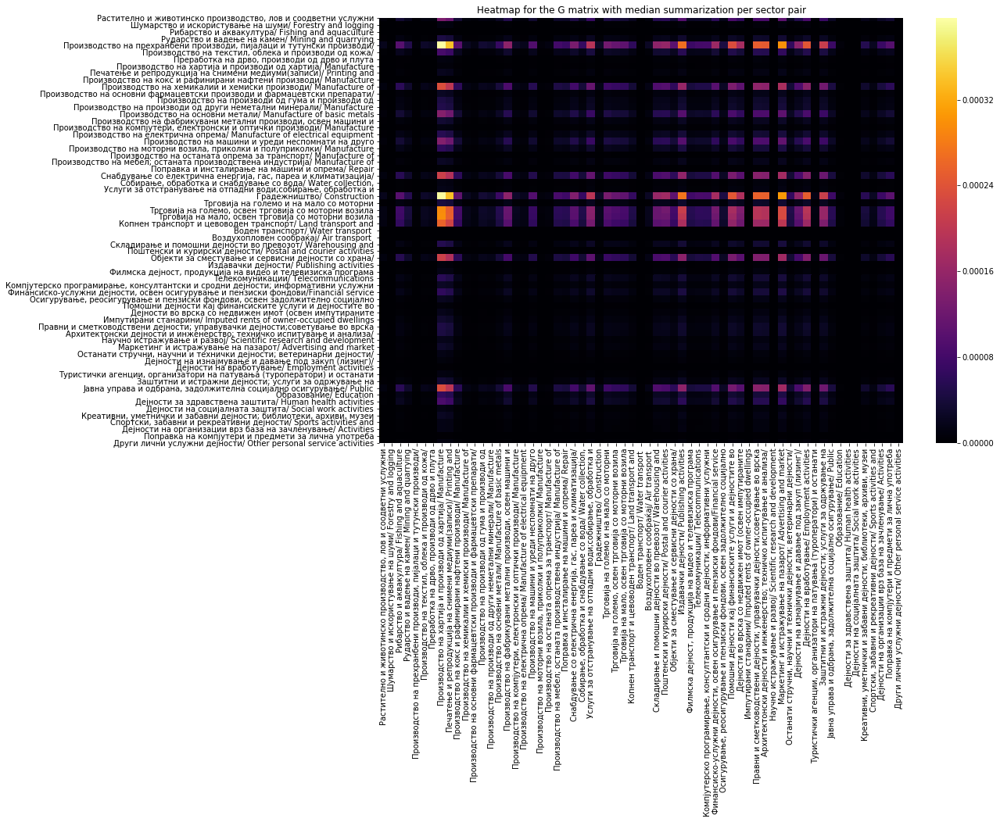

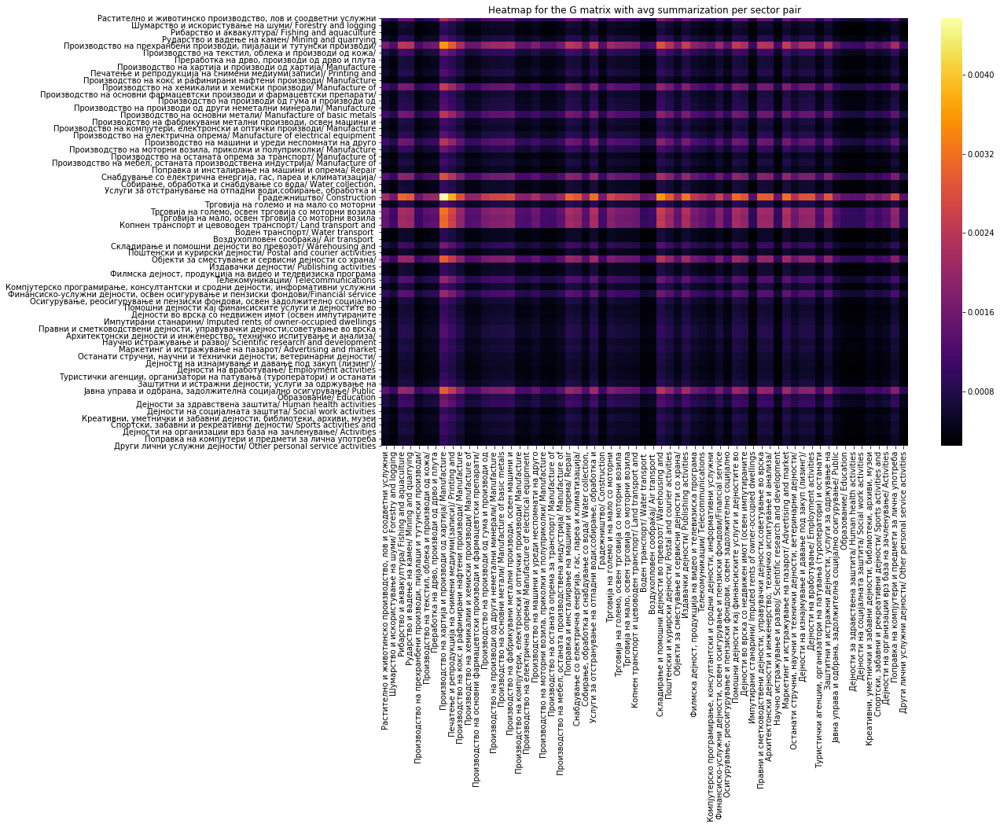

In [120]:
# Visualizing link sensitivities for matrix G
visualizer.visualize_links_sensitivity(metrics,'G')

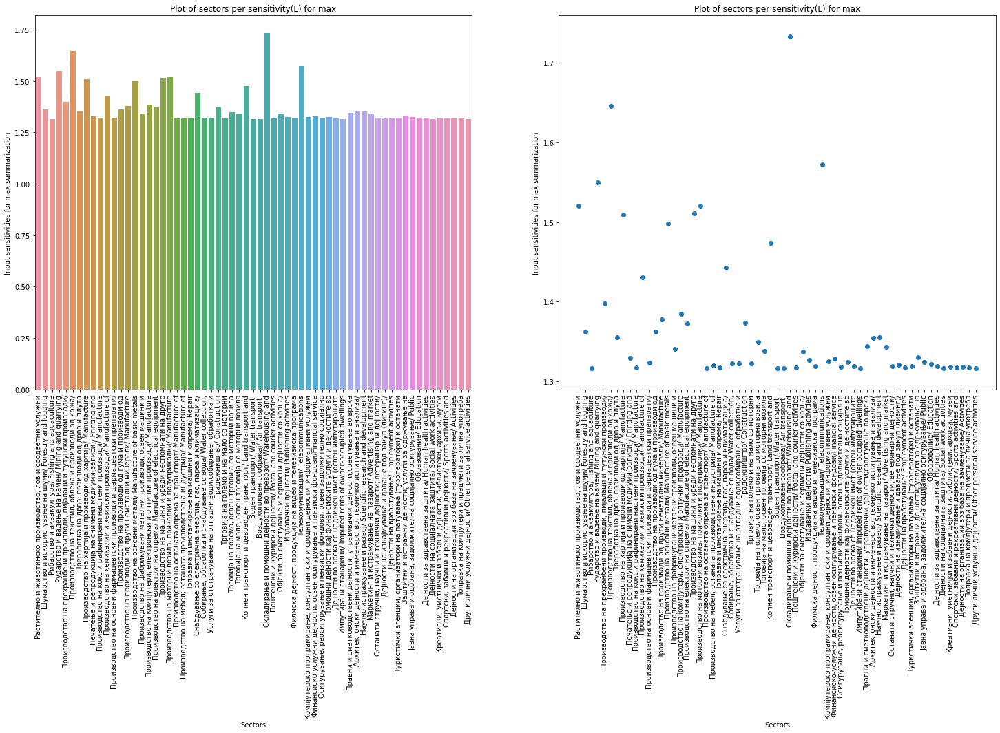

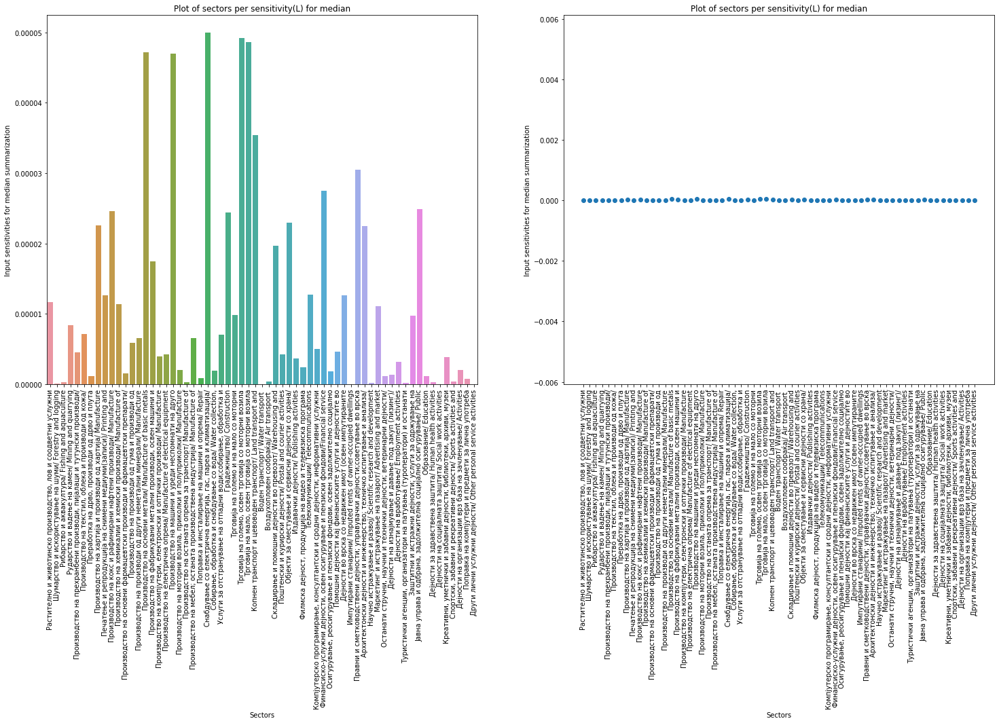

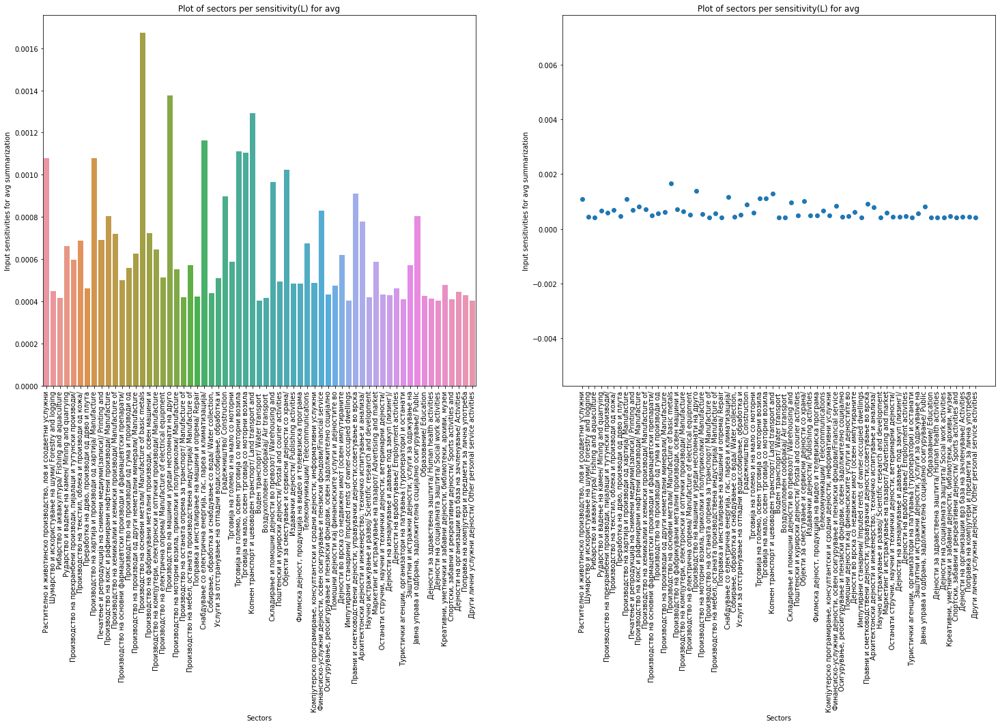

In [121]:
#Drawing barplots and scatterplots for the input sectors summed sensitivities by metrics for both L and G
visualizer.visualize_sectors_sensitivity(metrics,'L',True)

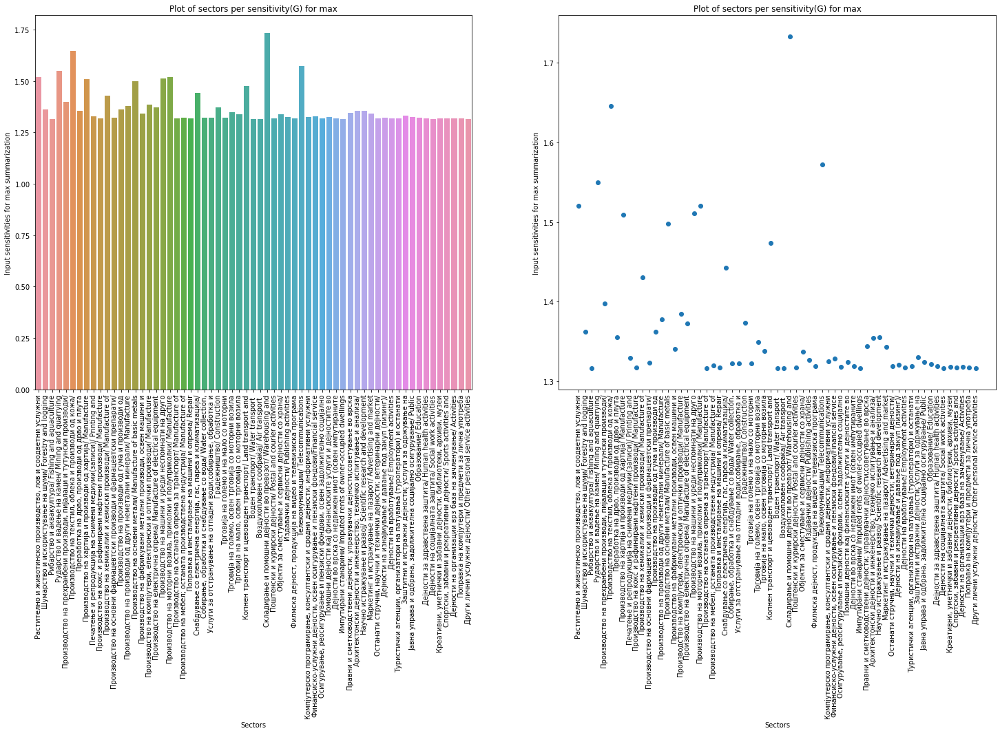

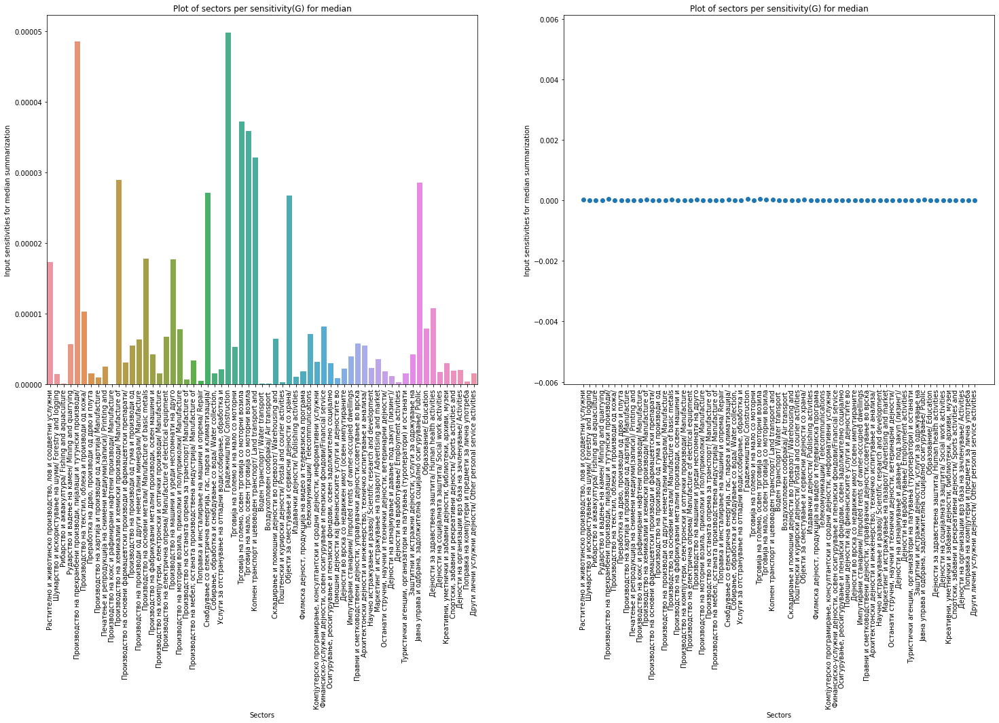

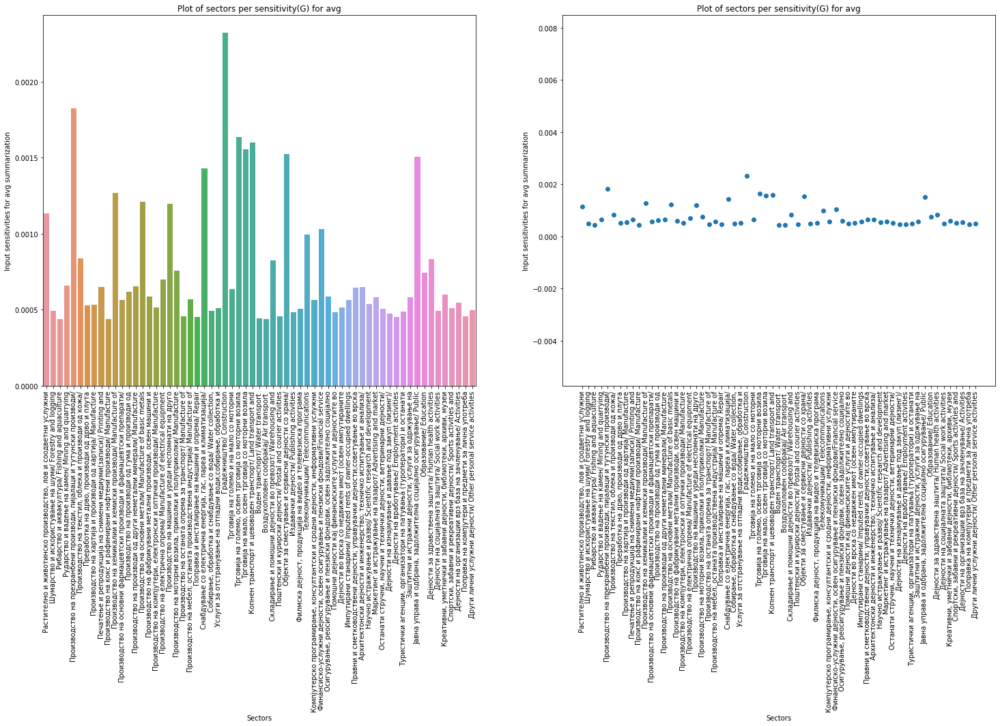

In [122]:
# For G matrix as input
visualizer.visualize_sectors_sensitivity(metrics,'G',True)

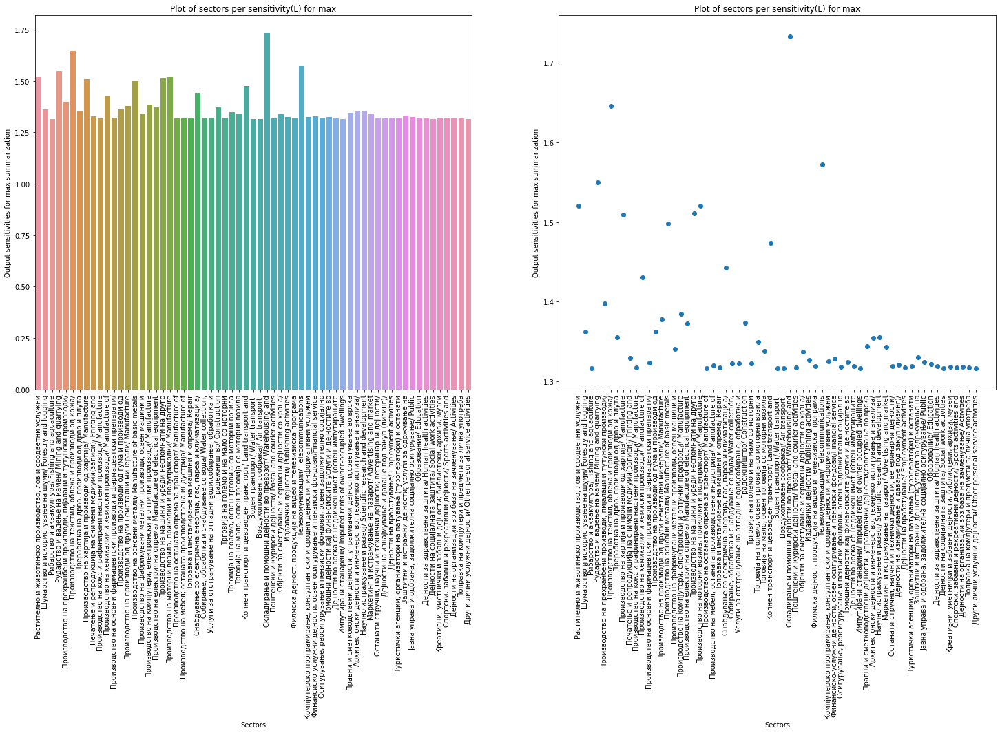

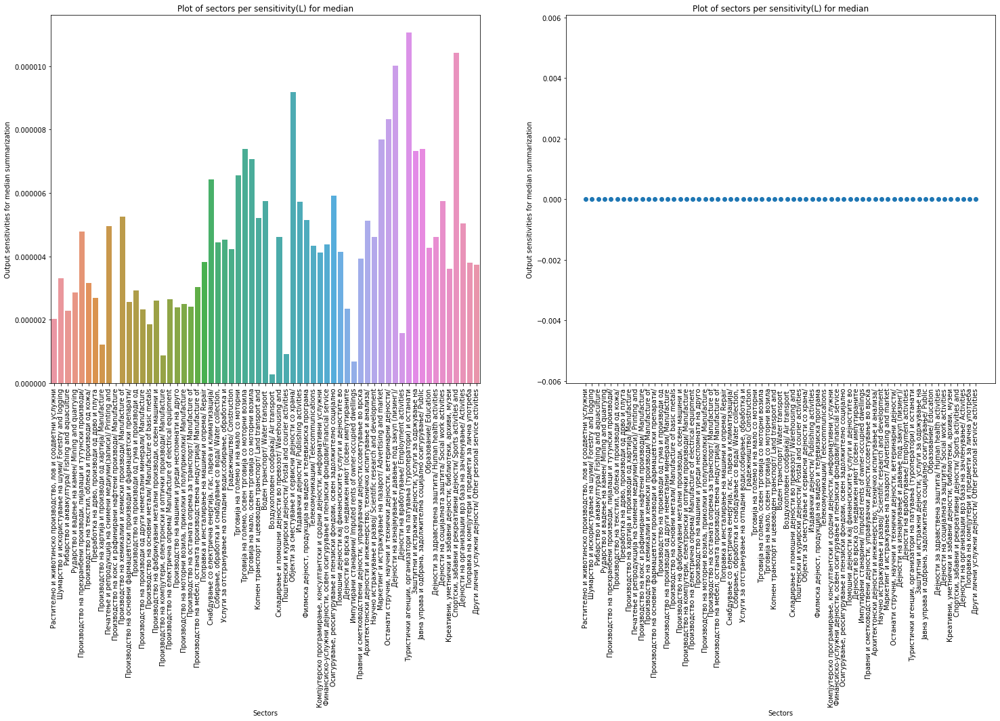

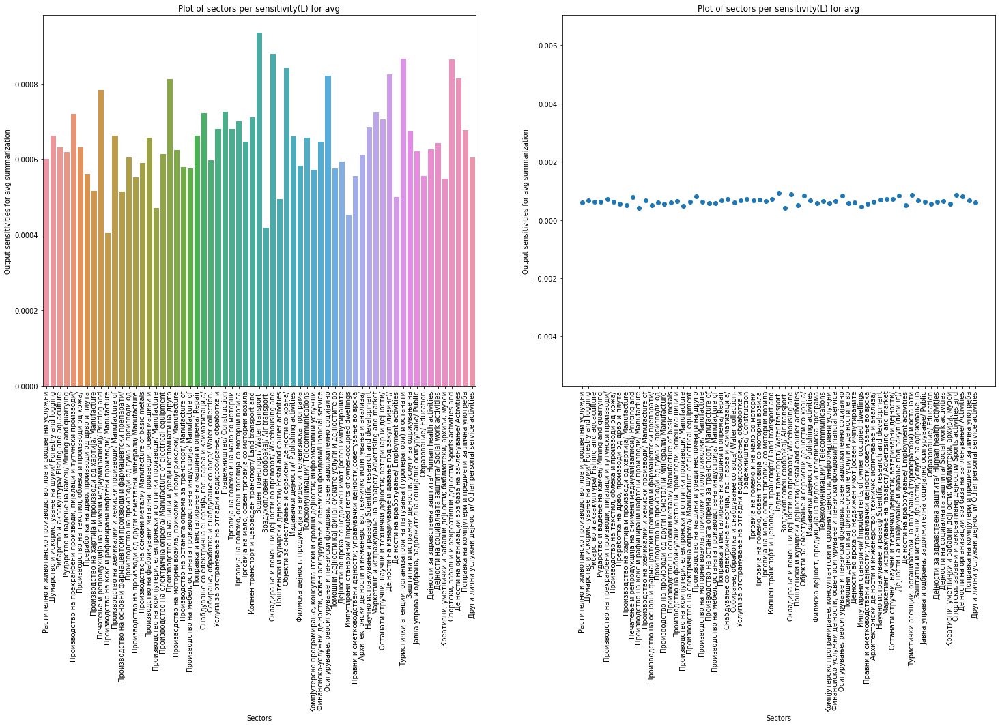

In [123]:
# L matrix as output
visualizer.visualize_sectors_sensitivity(metrics,'L',False)

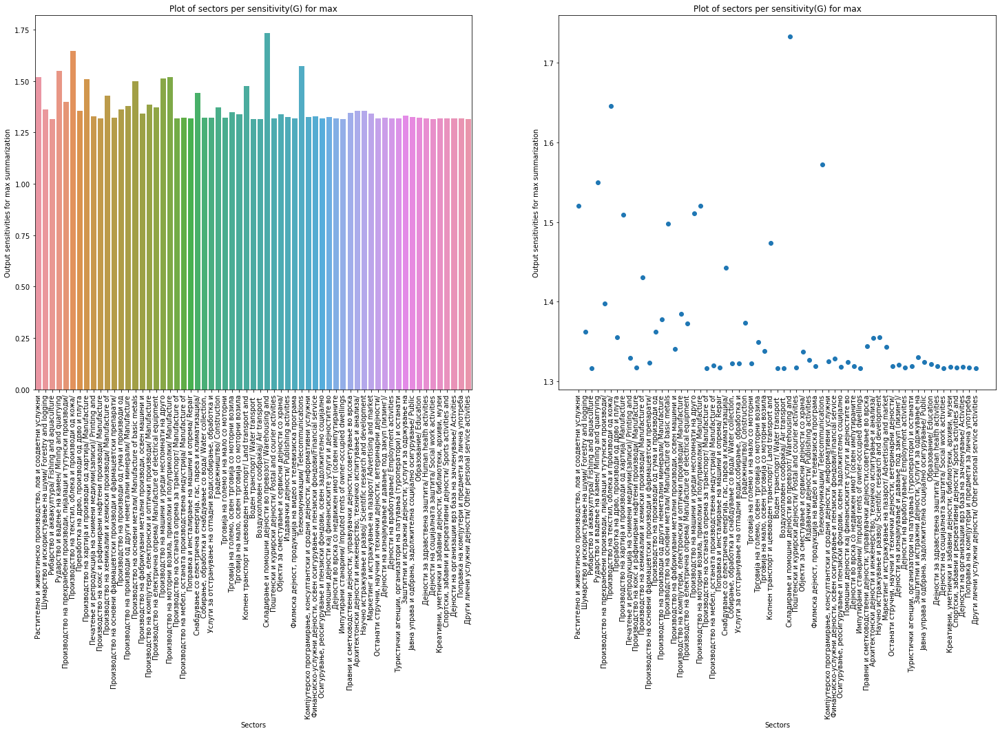

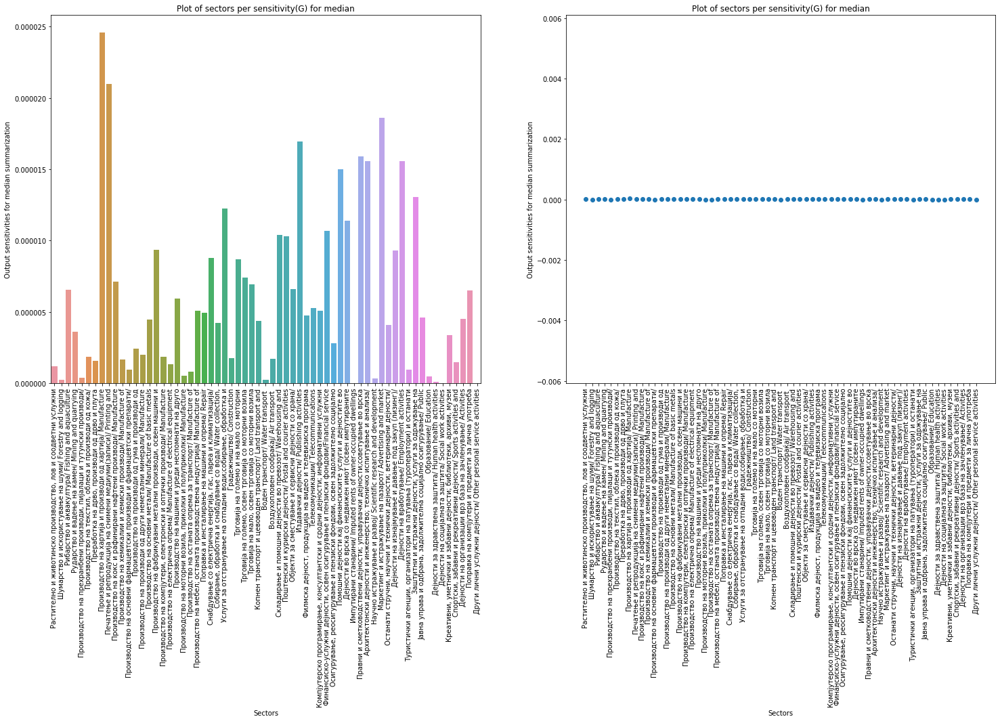

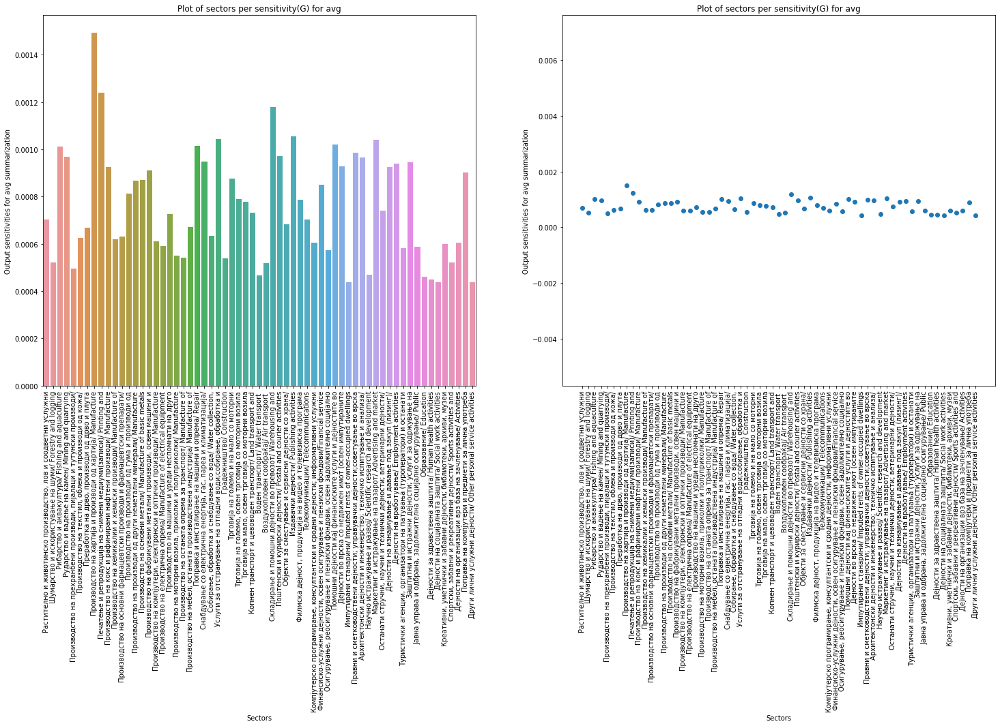

In [124]:
# G matrix as output
visualizer.visualize_sectors_sensitivity(metrics,'G',False)

Summary of the sorted links for the L matrix: 


Top 20 links with  max  summarization metric:
1 . Sector pair:  Складирање и помошни дејности во превозот/ Warehousing and AND Складирање и помошни дејности во превозот/ Warehousing and  :  1.7329176587923523
2 . Sector pair:  Производство на текстил, облека и производи од кожа/ AND Складирање и помошни дејности во превозот/ Warehousing and  :  1.645647296208998
3 . Sector pair:  Складирање и помошни дејности во превозот/ Warehousing and AND Производство на текстил, облека и производи од кожа/  :  1.645647296208998
4 . Sector pair:  Складирање и помошни дејности во превозот/ Warehousing and AND Телекомуникации/ Telecommunications  :  1.5718909542904305
5 . Sector pair:  Телекомуникации/ Telecommunications AND Складирање и помошни дејности во превозот/ Warehousing and  :  1.5718909542904305
6 . Sector pair:  Производство на текстил, облека и производи од кожа/ AND Производство на текстил, облека и производи од кожа/  :  1.5627719007764418

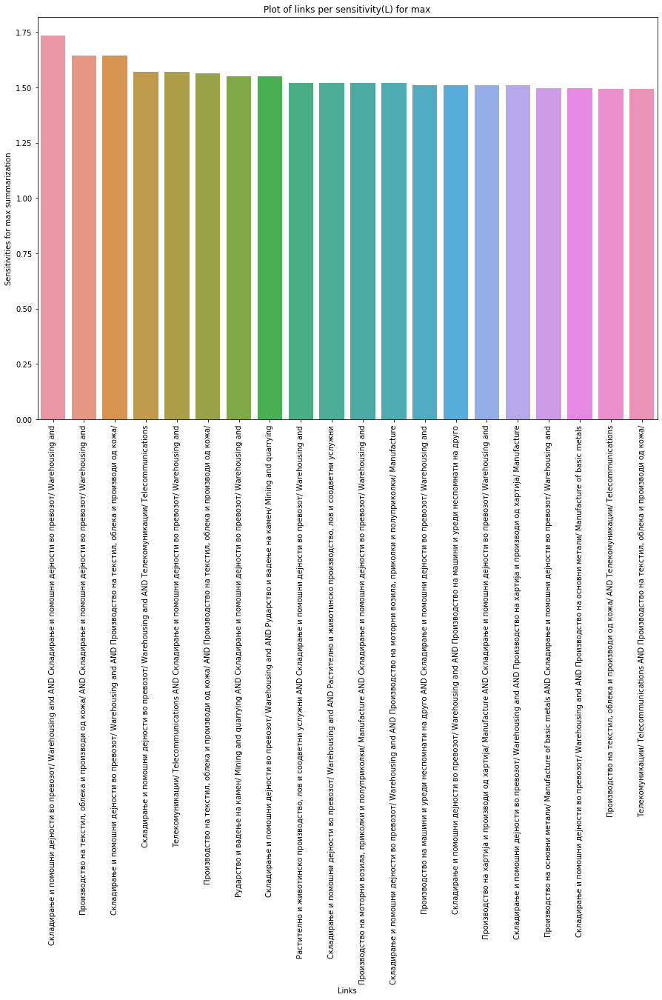

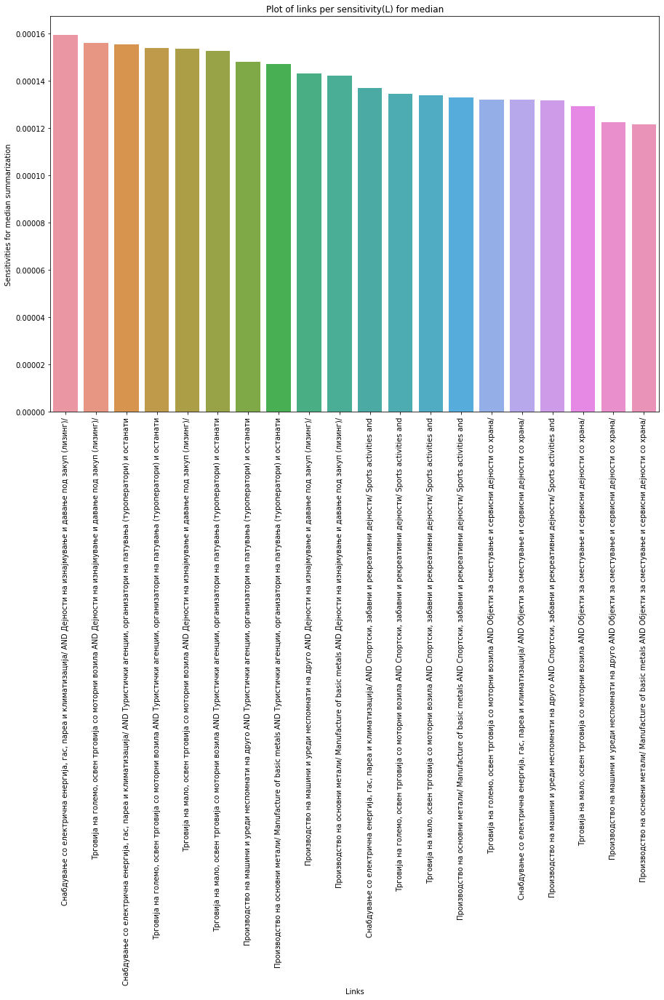

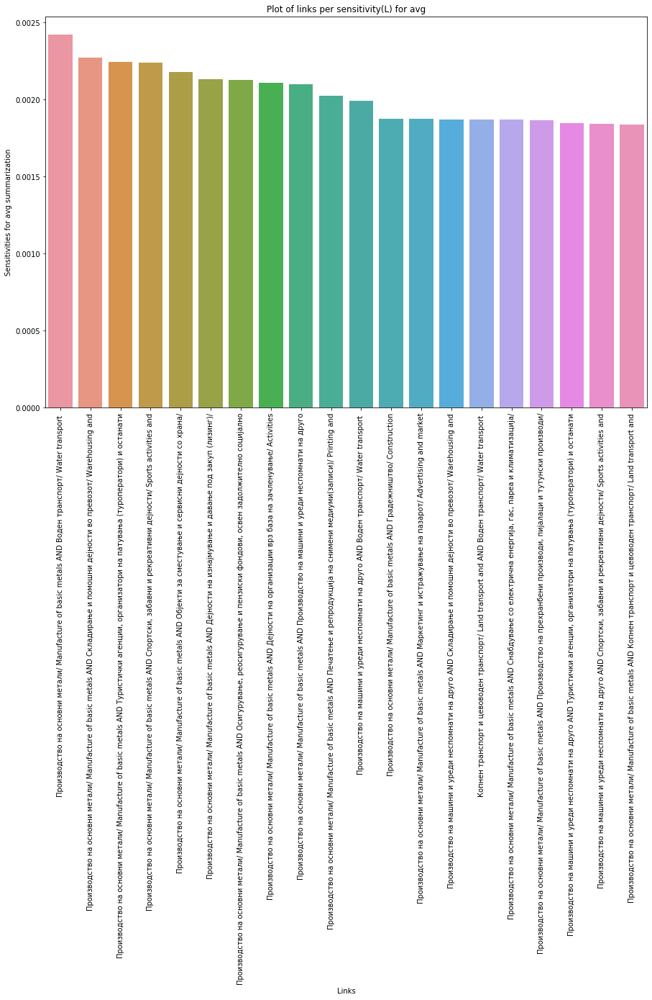

In [125]:
# Visualizing the sorted links for the L and G matrix in descending order and giving info about the top k links
top_k = 20

# L matrix
visualizer.visualize_describe_top_k_sorted_links_sensitivity(metrics,top_k,matrix='L',asc=False)

Summary of the sorted links for the G matrix: 


Top 20 links with  max  summarization metric:
1 . Sector pair:  Складирање и помошни дејности во превозот/ Warehousing and AND Складирање и помошни дејности во превозот/ Warehousing and  :  1.7329176587923523
2 . Sector pair:  Производство на текстил, облека и производи од кожа/ AND Складирање и помошни дејности во превозот/ Warehousing and  :  1.645647296208998
3 . Sector pair:  Складирање и помошни дејности во превозот/ Warehousing and AND Производство на текстил, облека и производи од кожа/  :  1.645647296208998
4 . Sector pair:  Складирање и помошни дејности во превозот/ Warehousing and AND Телекомуникации/ Telecommunications  :  1.5718909542904305
5 . Sector pair:  Телекомуникации/ Telecommunications AND Складирање и помошни дејности во превозот/ Warehousing and  :  1.5718909542904305
6 . Sector pair:  Производство на текстил, облека и производи од кожа/ AND Производство на текстил, облека и производи од кожа/  :  1.5627719007764418

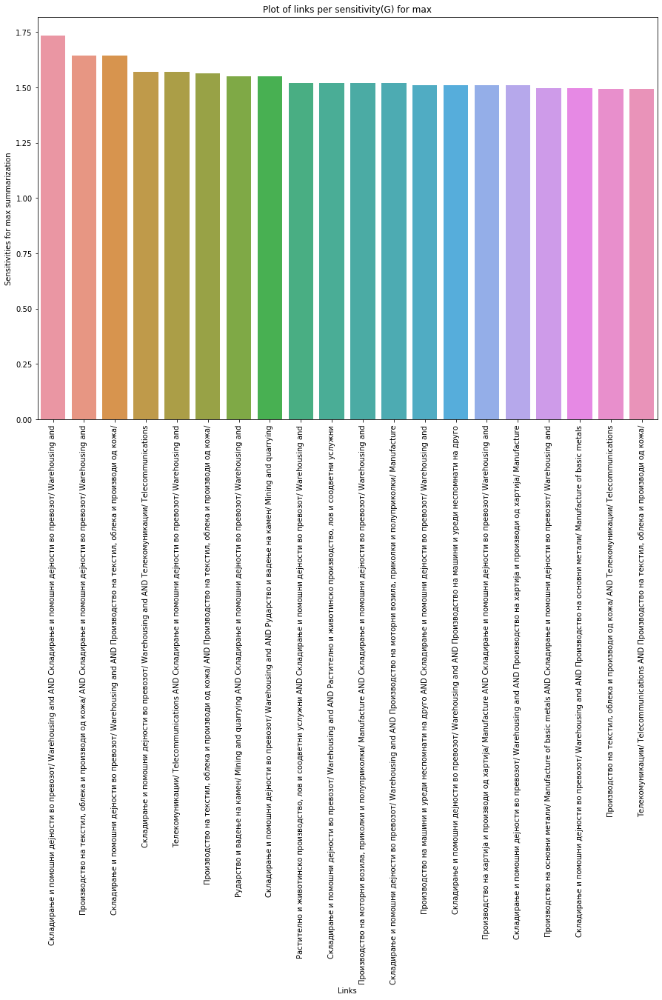

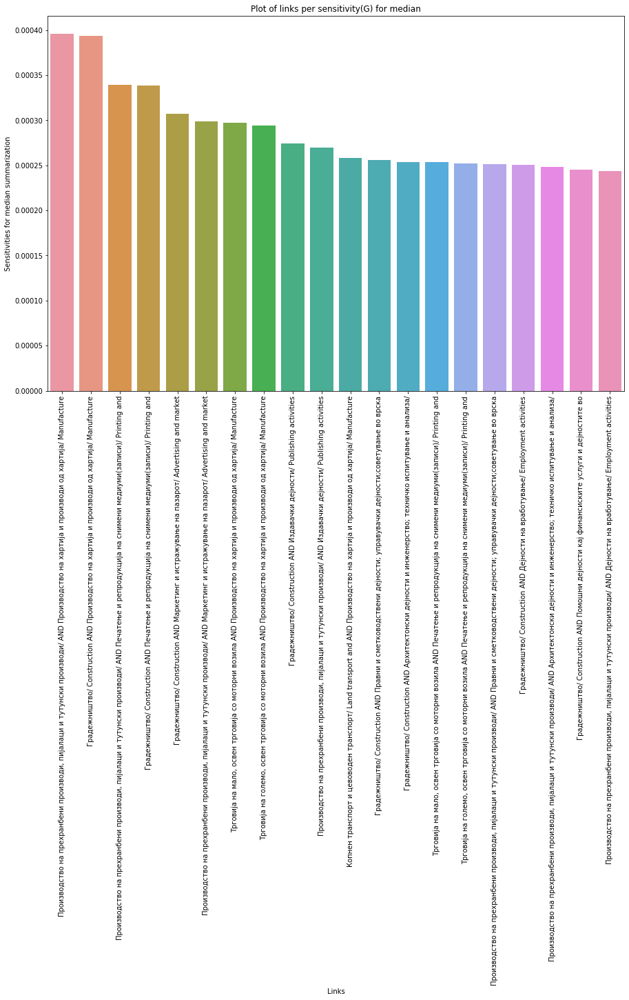

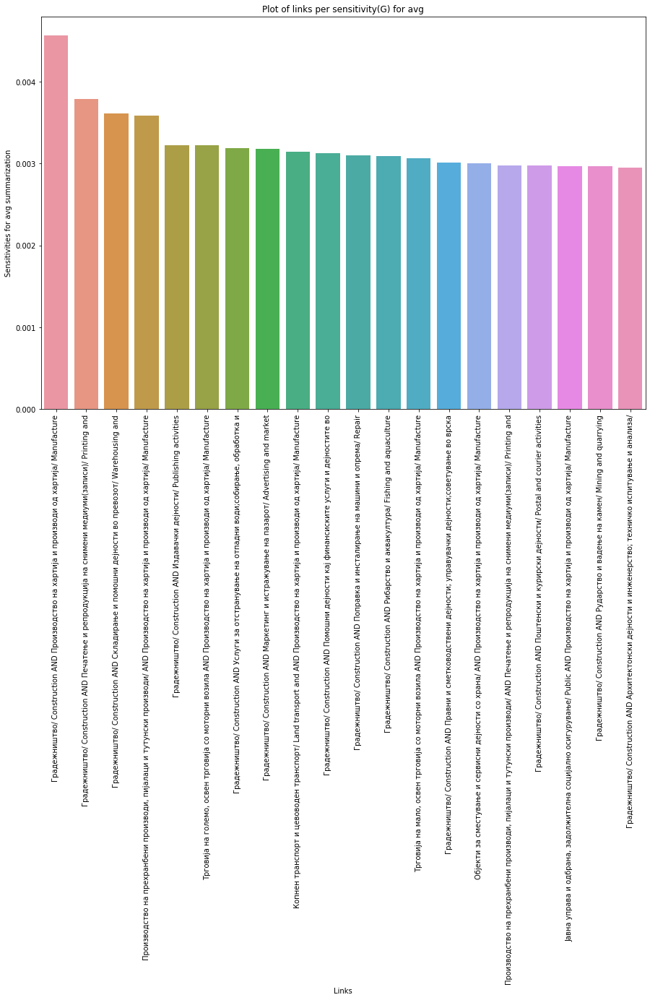

In [126]:
# G matrix
visualizer.visualize_describe_top_k_sorted_links_sensitivity(metrics,top_k,matrix='G',asc=False)

In [127]:
# Visualizing sorted sectors now by input and output in descending order using L and G

Sensitivities for input sectors: 
Derived from matrix:  L


Top 20 sectors with  max  summarization metric:
1 . Sector:  Складирање и помошни дејности во превозот/ Warehousing and  :  1.7329176587923523
2 . Sector:  Производство на текстил, облека и производи од кожа/  :  1.645647296208998
3 . Sector:  Телекомуникации/ Telecommunications  :  1.5718909542904305
4 . Sector:  Рударство и вадење на камен/ Mining and quarrying  :  1.549937296867573
5 . Sector:  Растително и животинско производство, лов и соодветни услужни  :  1.5205854673065617
6 . Sector:  Производство на моторни возила, приколки и полуприколки/ Manufacture  :  1.520119455419515
7 . Sector:  Производство на машини и уреди неспомнати на друго  :  1.5109423577162824
8 . Sector:  Производство на хартија и производи од хартија/ Manufacture  :  1.508759410652881
9 . Sector:  Производство на основни метали/ Manufacture of basic metals  :  1.4980885570121096
10 . Sector:  Копнен транспорт и цевоводен транспорт/ Land transport and

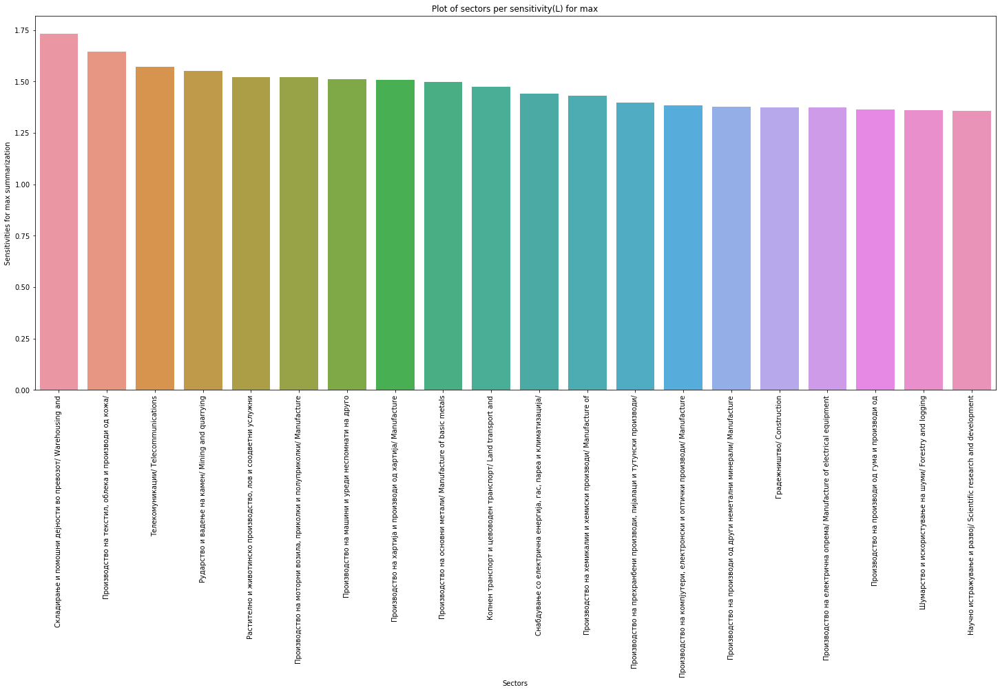

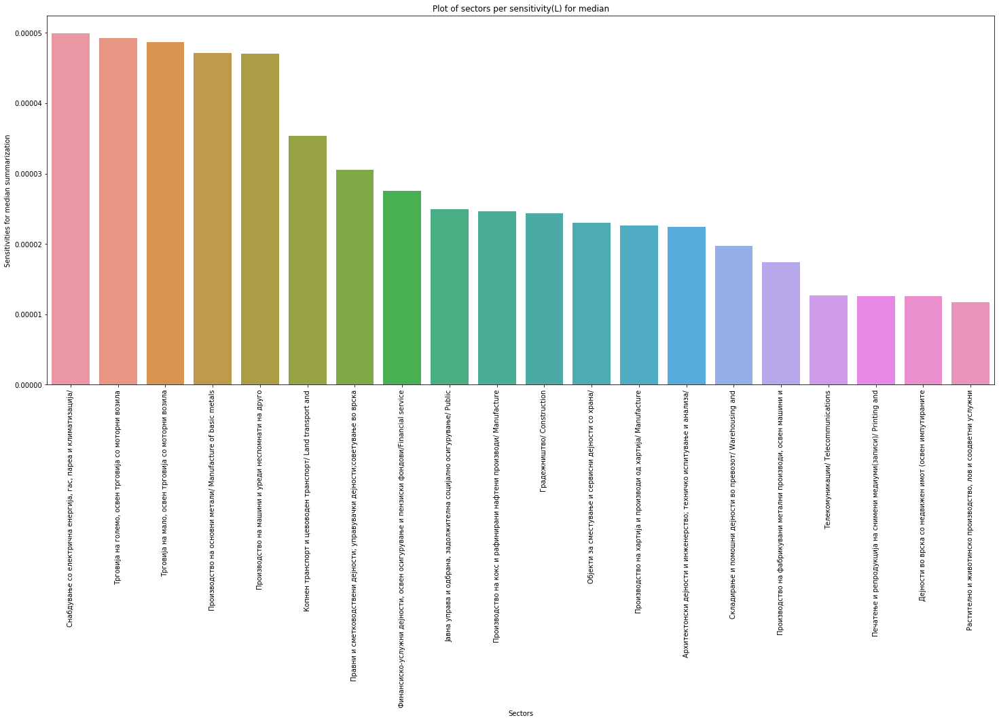

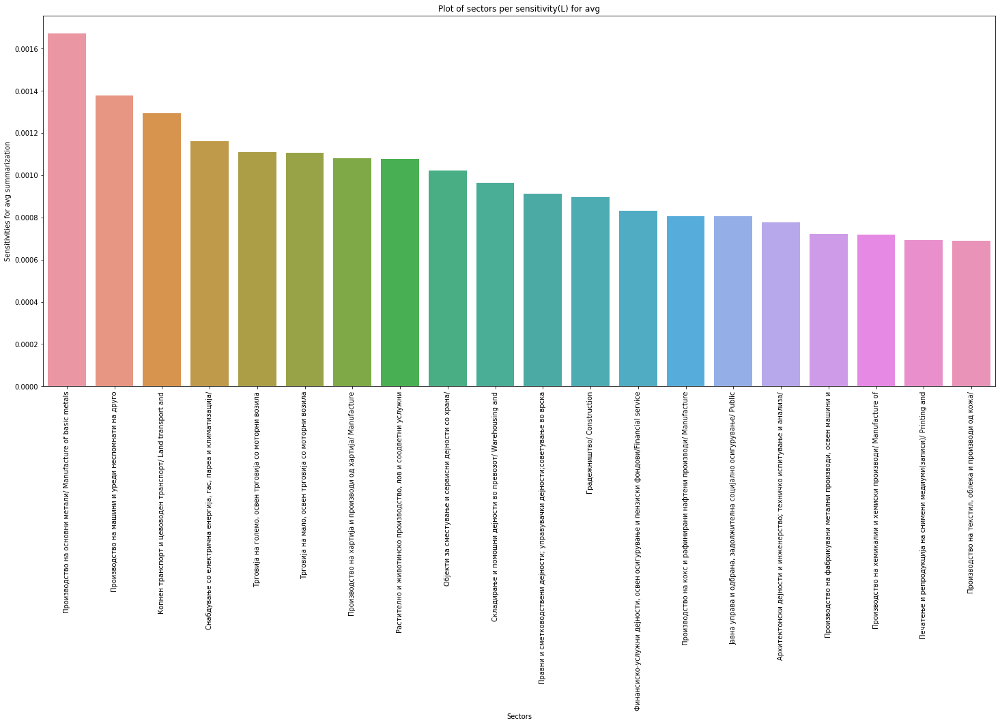

In [128]:
# For input sectors using L
visualizer.visualize_describe_top_k_sorted_sectors_sensitivity(metrics,top_k,matrix='L',type_input=True,asc=False)

Sensitivities for input sectors: 
Derived from matrix:  G


Top 20 sectors with  max  summarization metric:
1 . Sector:  Складирање и помошни дејности во превозот/ Warehousing and  :  1.7329176587923523
2 . Sector:  Производство на текстил, облека и производи од кожа/  :  1.645647296208998
3 . Sector:  Телекомуникации/ Telecommunications  :  1.5718909542904305
4 . Sector:  Рударство и вадење на камен/ Mining and quarrying  :  1.5499372968675729
5 . Sector:  Растително и животинско производство, лов и соодветни услужни  :  1.5205854673065615
6 . Sector:  Производство на моторни возила, приколки и полуприколки/ Manufacture  :  1.5201194554195148
7 . Sector:  Производство на машини и уреди неспомнати на друго  :  1.5109423577162826
8 . Sector:  Производство на хартија и производи од хартија/ Manufacture  :  1.508759410652881
9 . Sector:  Производство на основни метали/ Manufacture of basic metals  :  1.4980885570121096
10 . Sector:  Копнен транспорт и цевоводен транспорт/ Land transport a

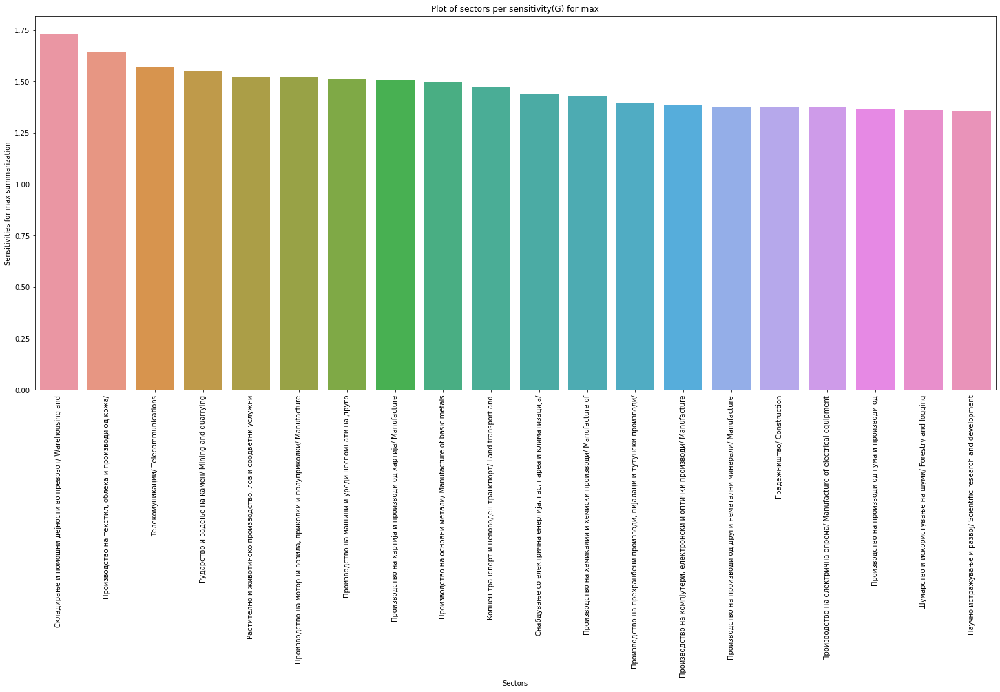

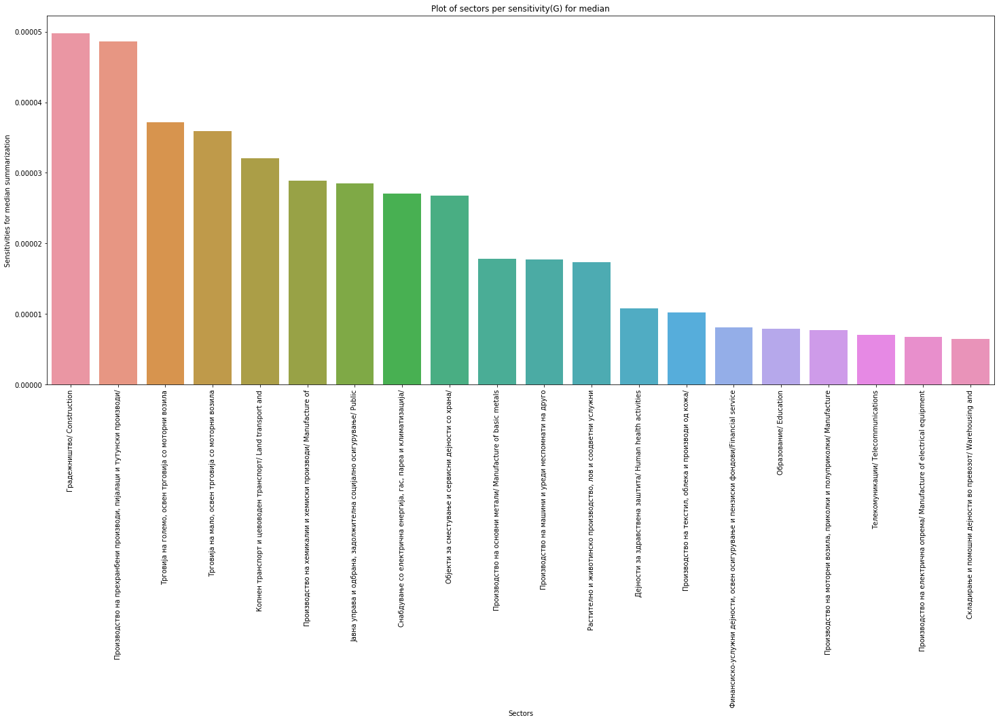

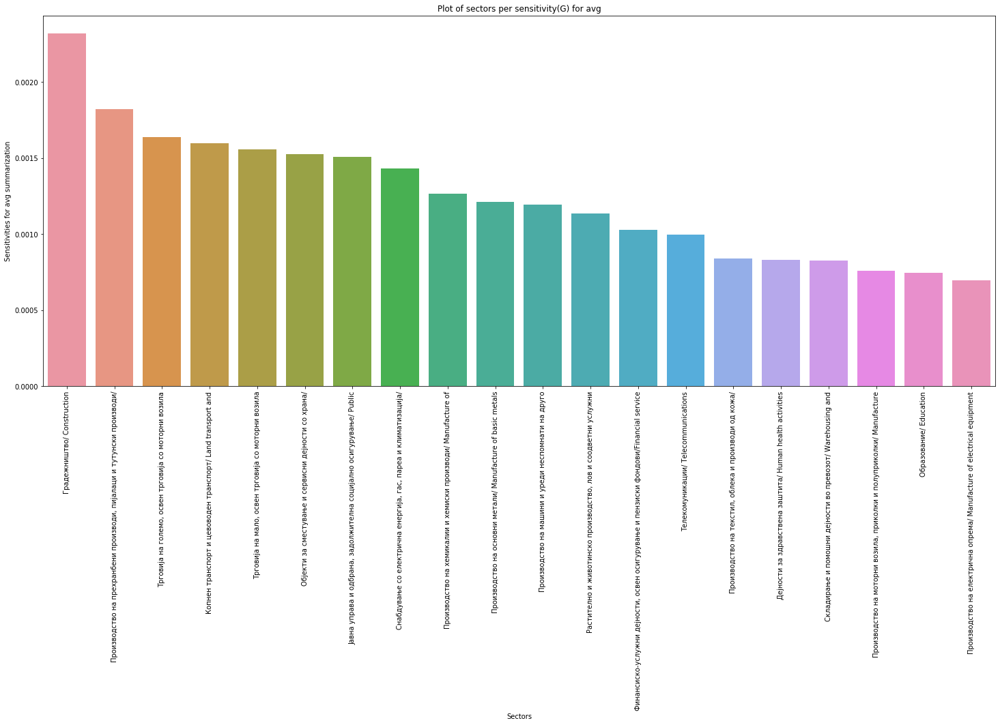

In [129]:
# For input sectors using G
visualizer.visualize_describe_top_k_sorted_sectors_sensitivity(metrics,top_k,matrix='G',type_input=True,asc=False)

Sensitivities for output sectors: 
Derived from matrix:  L


Top 20 sectors with  max  summarization metric:
1 . Sector:  Складирање и помошни дејности во превозот/ Warehousing and  :  1.7329176587923523
2 . Sector:  Производство на текстил, облека и производи од кожа/  :  1.645647296208998
3 . Sector:  Телекомуникации/ Telecommunications  :  1.5718909542904305
4 . Sector:  Рударство и вадење на камен/ Mining and quarrying  :  1.549937296867573
5 . Sector:  Растително и животинско производство, лов и соодветни услужни  :  1.5205854673065617
6 . Sector:  Производство на моторни возила, приколки и полуприколки/ Manufacture  :  1.520119455419515
7 . Sector:  Производство на машини и уреди неспомнати на друго  :  1.5109423577162824
8 . Sector:  Производство на хартија и производи од хартија/ Manufacture  :  1.508759410652881
9 . Sector:  Производство на основни метали/ Manufacture of basic metals  :  1.4980885570121096
10 . Sector:  Копнен транспорт и цевоводен транспорт/ Land transport an

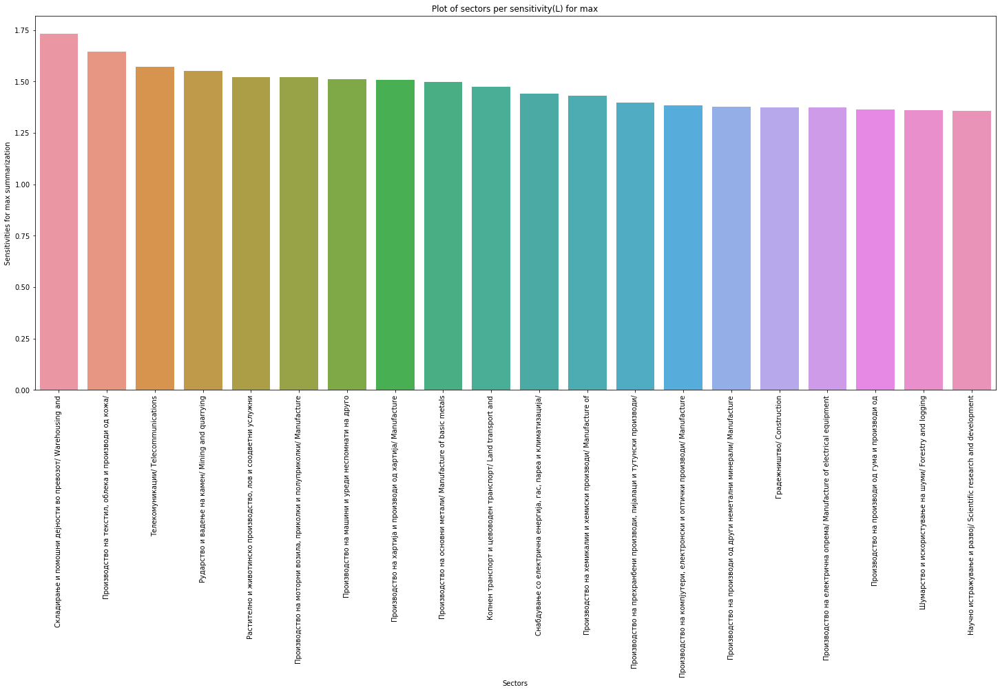

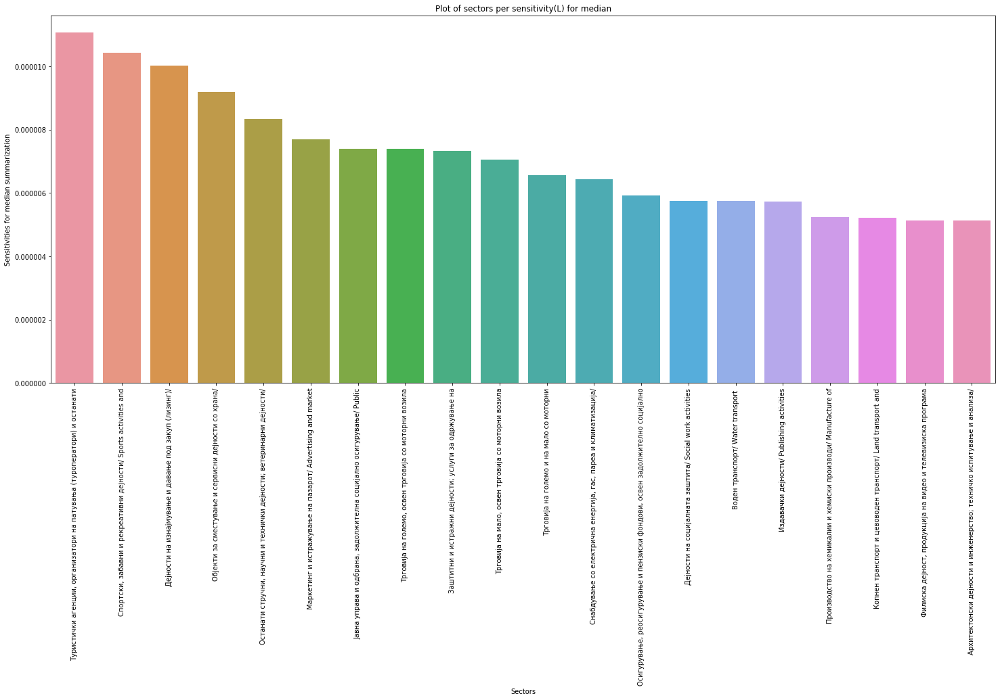

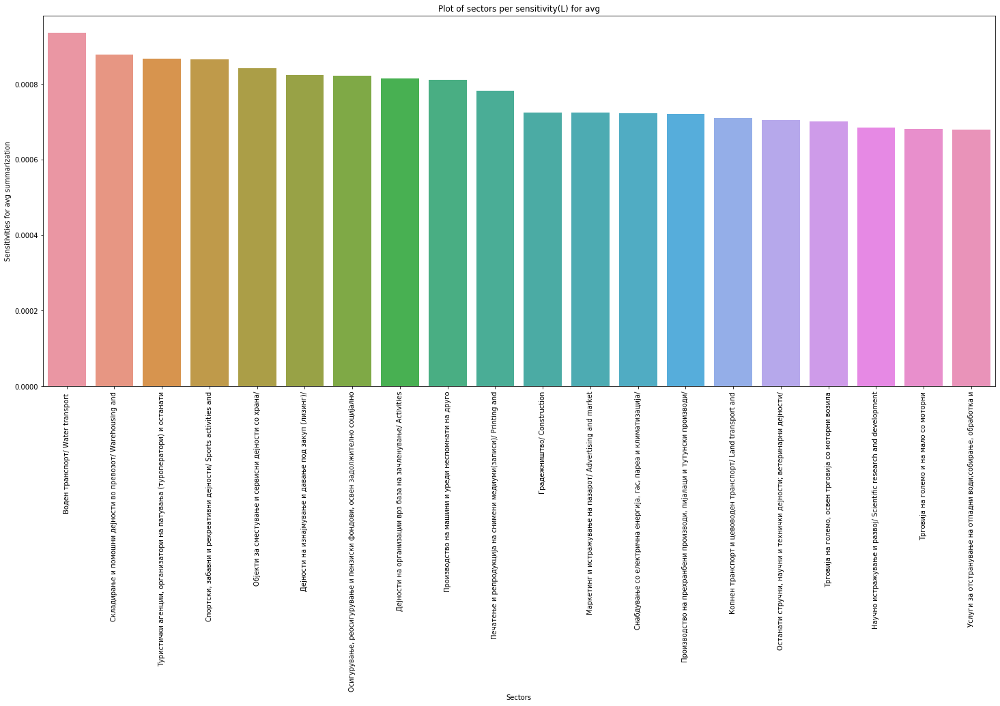

In [130]:
# For output sectors using L
visualizer.visualize_describe_top_k_sorted_sectors_sensitivity(metrics,top_k,matrix='L',type_input=False,asc=False)

Sensitivities for output sectors: 
Derived from matrix:  G


Top 20 sectors with  max  summarization metric:
1 . Sector:  Складирање и помошни дејности во превозот/ Warehousing and  :  1.7329176587923523
2 . Sector:  Производство на текстил, облека и производи од кожа/  :  1.645647296208998
3 . Sector:  Телекомуникации/ Telecommunications  :  1.5718909542904305
4 . Sector:  Рударство и вадење на камен/ Mining and quarrying  :  1.5499372968675729
5 . Sector:  Растително и животинско производство, лов и соодветни услужни  :  1.5205854673065615
6 . Sector:  Производство на моторни возила, приколки и полуприколки/ Manufacture  :  1.5201194554195148
7 . Sector:  Производство на машини и уреди неспомнати на друго  :  1.5109423577162826
8 . Sector:  Производство на хартија и производи од хартија/ Manufacture  :  1.508759410652881
9 . Sector:  Производство на основни метали/ Manufacture of basic metals  :  1.4980885570121096
10 . Sector:  Копнен транспорт и цевоводен транспорт/ Land transport 

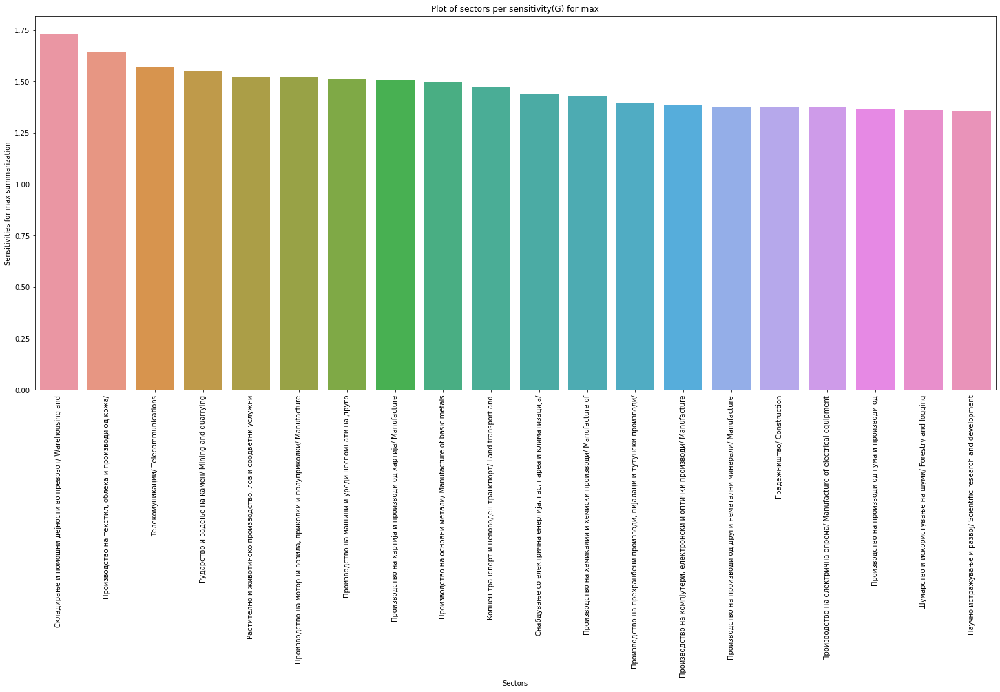

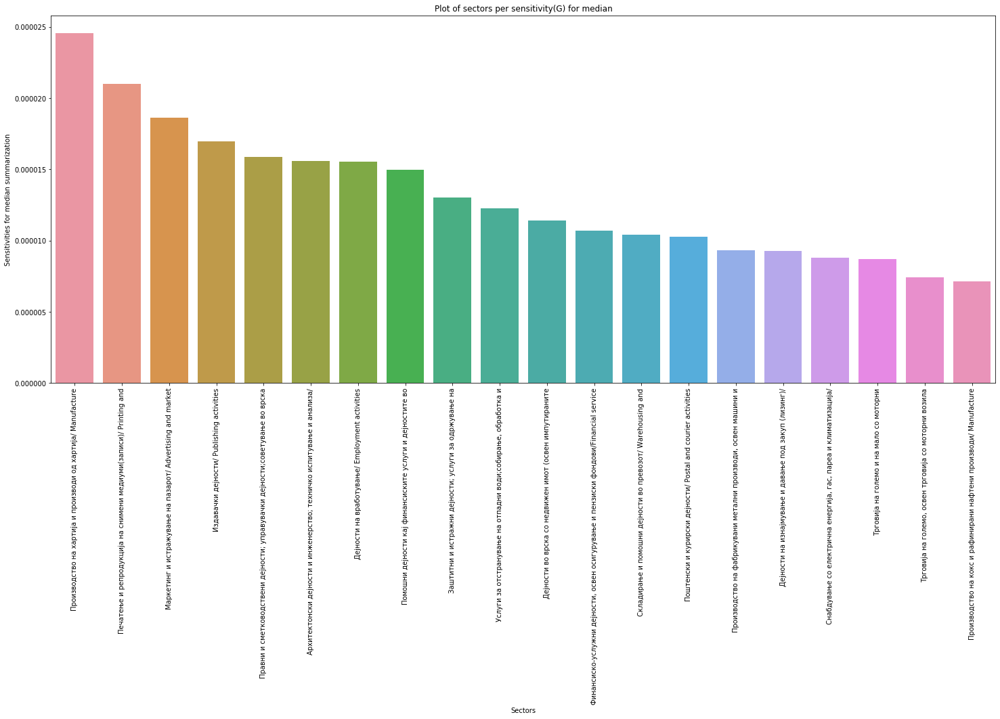

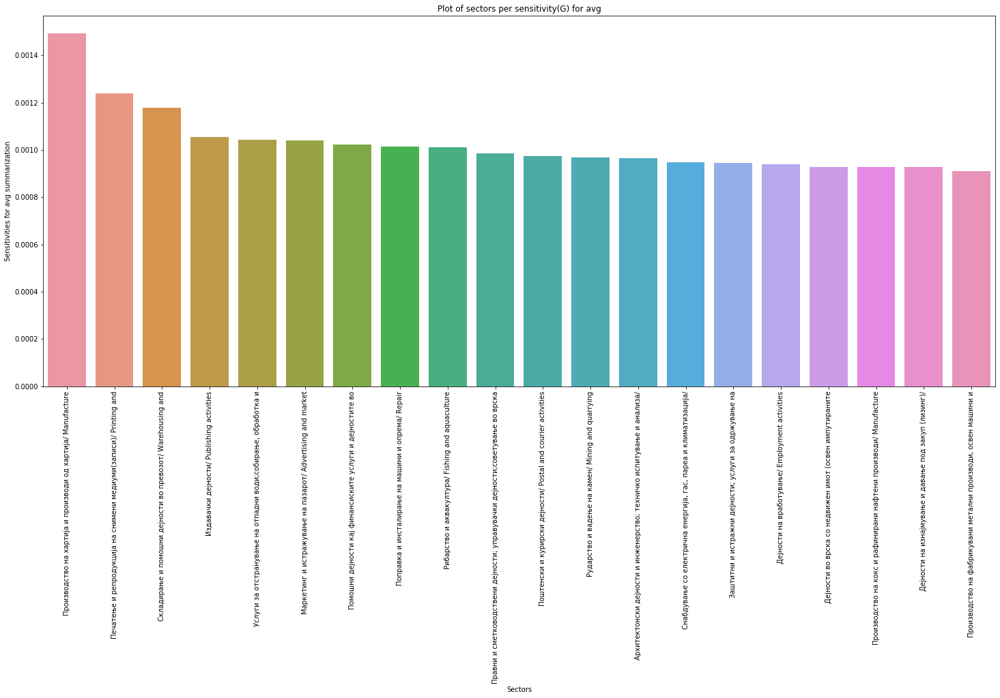

In [131]:
# For output sectors using G
visualizer.visualize_describe_top_k_sorted_sectors_sensitivity(metrics,top_k,matrix='G',type_input=False,asc=False)

In [132]:
# COBB DOUGLAS model visualizations

# Defining the columns to use for calculation of f
f_columns = ["Трошоци за финална потрошувачка на домаќинствата/ Final consumption expenditure by households",
            "Трошоци за финална потрошувачка на непрофитни институции кои им служат на домаќинствата (НПИСД)/  Final consumption expenditure by non-profit organisations serving households (NPISH)",
            "Трошоци за јавна потрошувачка/ Final consumption expenditure by government",
            "Инвестиции во основни средства/ Gross fixed capital formation"]

In [133]:
# We can calculate the shock matrix which would represent a matrix of multipliers denoting change in each sector-
# sector link for a change in A[u,v] denoted by delta_A[u,v]. Meaning, for each shock induced in sector pairs u,v we
# get a shock matrix P of size num_sectors*num_sectors which holds multipliers of the form p_i,j denoting how much each
# link has changed with the shock. 
# Next, we want to calculate a geometric mean of each of the columns of the P matrix in order to get a summarized impact
# of the shock in link (u,v) throughout the whole economy(GDP multiplier) according to equation (26). We also
# reshape the vector as an num_sectors x num_sectors matrix. 

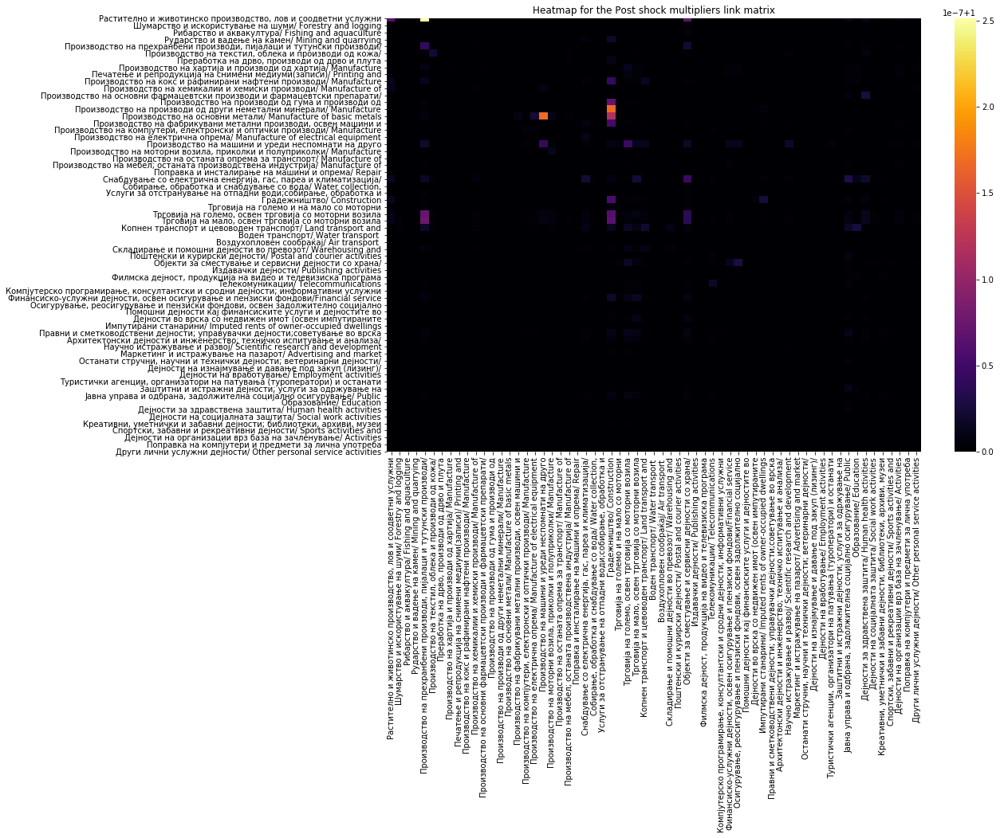

Top ten positive links: 
Sector link shock importance:  Растително и животинско производство, лов и соодветни услужни : Производство на прехранбени производи, пијалаци и тутунски производи/  =  1.0000002513239412
Sector link shock importance:  Производство на основни метали/ Manufacture of basic metals : Производство на машини и уреди неспомнати на друго  =  1.0000001694657066
Sector link shock importance:  Производство на производи од други неметални минерали/ Manufacture : Градежништво/ Construction  =  1.0000001676714254
Sector link shock importance:  Производство на основни метали/ Manufacture of basic metals : Градежништво/ Construction  =  1.0000001182948208
Sector link shock importance:  Трговија на мало, освен трговија со моторни возила : Производство на прехранбени производи, пијалаци и тутунски производи/  =  1.0000000766013248
Sector link shock importance:  Трговија на големо, освен трговија со моторни возила : Производство на прехранбени производи, пијалаци и тутунски произ

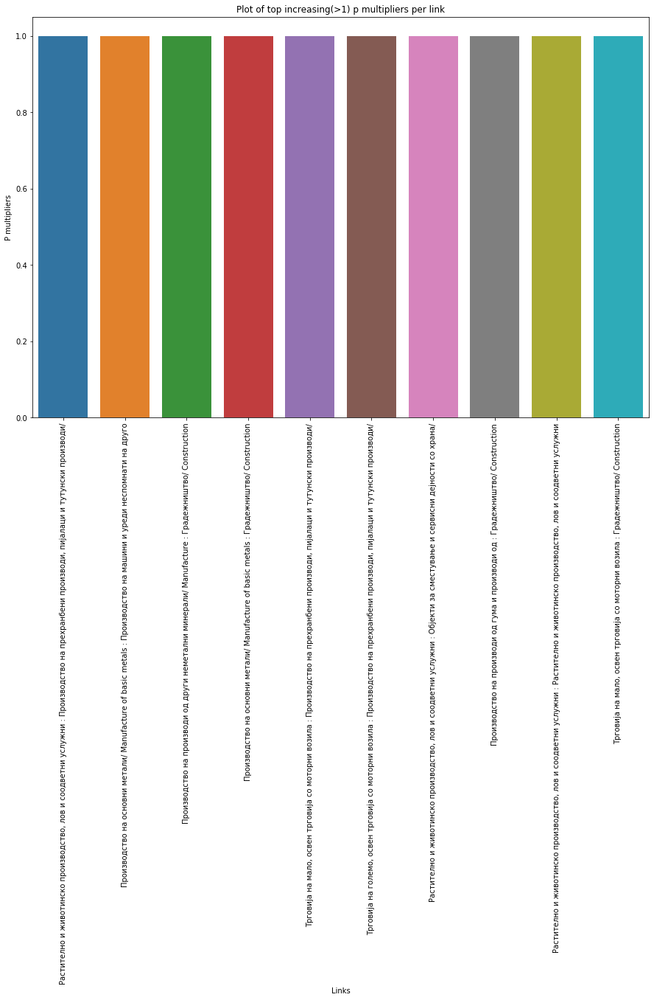





No links with p<1 values!


In [177]:
# Visualizing the results of the summarized P shock matrix (geometric mean aggregated)
visualizer.visualize_describe_link_global_shock_effect_and_top_k(f_columns)

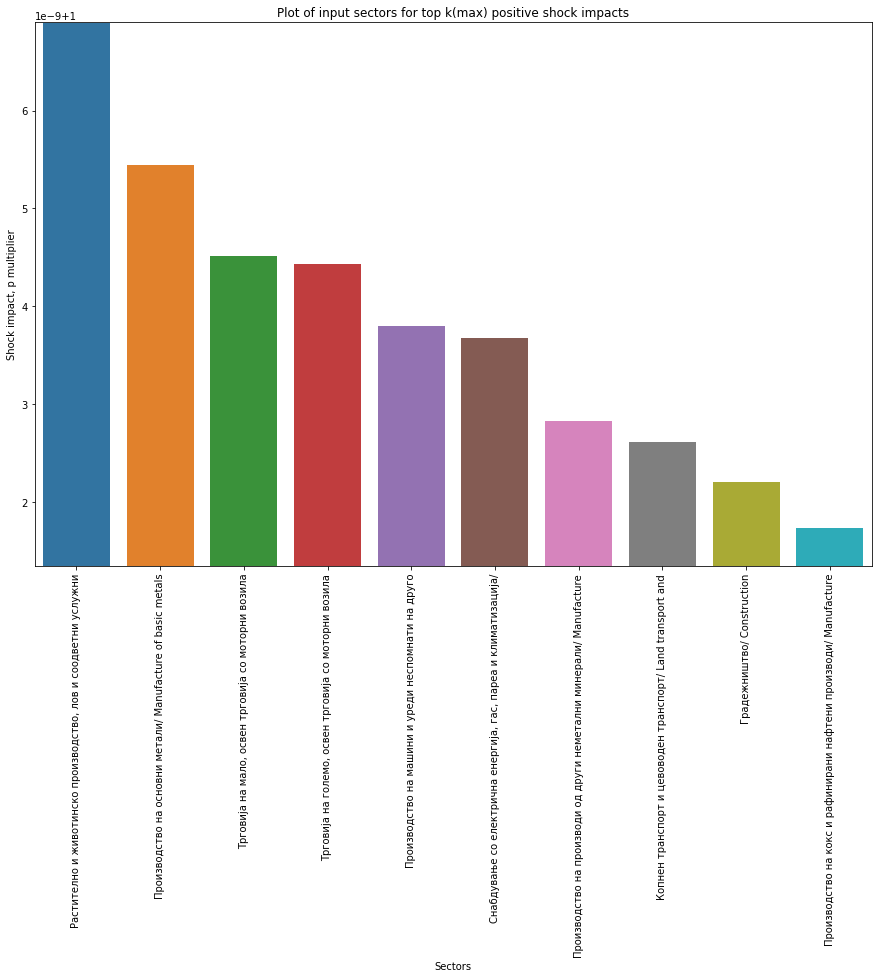

Top positive sector shocks: 
Sector shock importance:  Растително и животинско производство, лов и соодветни услужни  =  1.0000000069001036
Sector shock importance:  Производство на основни метали/ Manufacture of basic metals  =  1.0000000054418434
Sector shock importance:  Трговија на мало, освен трговија со моторни возила  =  1.0000000045104778
Sector shock importance:  Трговија на големо, освен трговија со моторни возила  =  1.000000004435561
Sector shock importance:  Производство на машини и уреди неспомнати на друго  =  1.0000000038020007
Sector shock importance:  Снабдување со електрична енергија, гас, пареа и климатизација/  =  1.000000003674528
Sector shock importance:  Производство на производи од други неметални минерали/ Manufacture  =  1.0000000028271514
Sector shock importance:  Копнен транспорт и цевоводен транспорт/ Land transport and  =  1.0000000026155573
Sector shock importance:  Градежништво/ Construction  =  1.0000000022045905
Sector shock importance:  Производство 

In [178]:
# Visualizing shock effect for input sectors from the summarized P matrix
visualizer.visualize_describe_global_shock_effect_sectors_top_k(f_columns,k=10,type_input=True)

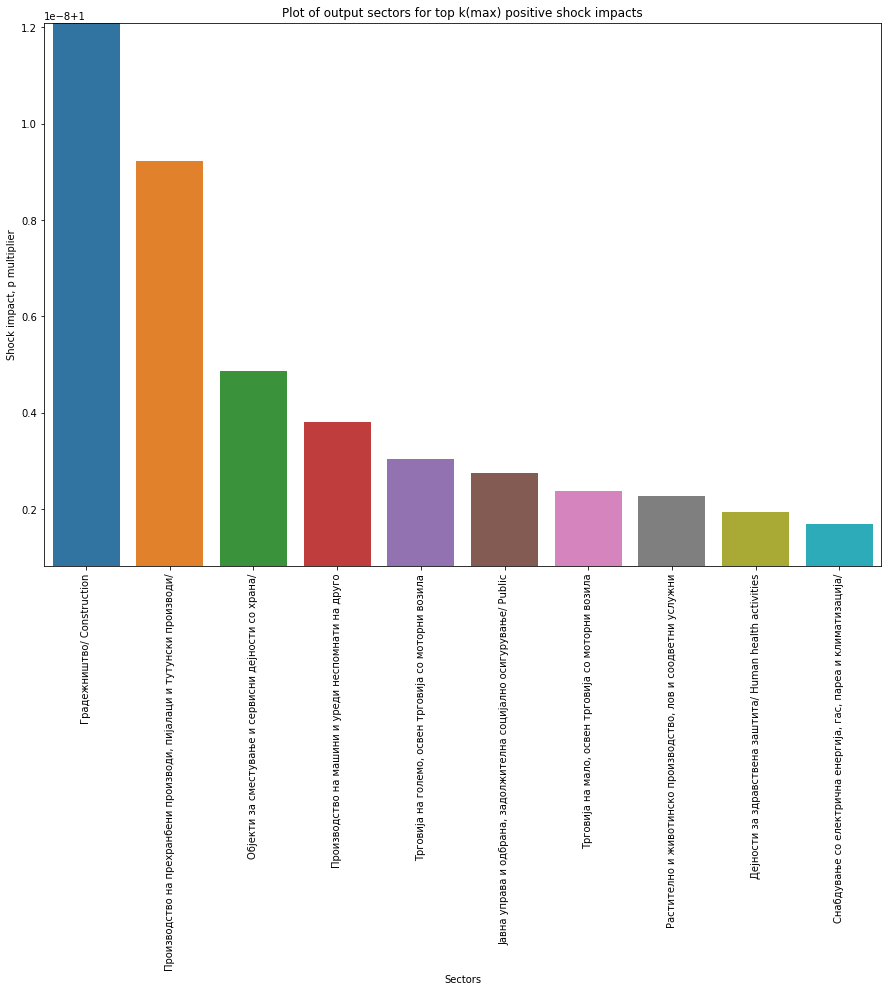

Top positive sector shocks: 
Sector shock importance:  Градежништво/ Construction  =  1.000000012098489
Sector shock importance:  Производство на прехранбени производи, пијалаци и тутунски производи/  =  1.0000000092167949
Sector shock importance:  Објекти за сместување и сервисни дејности со храна/  =  1.0000000048563713
Sector shock importance:  Производство на машини и уреди неспомнати на друго  =  1.0000000037981573
Sector shock importance:  Трговија на големо, освен трговија со моторни возила  =  1.0000000030368628
Sector shock importance:  Јавна управа и одбрана, задолжителна социјално осигурување/ Public  =  1.00000000273804
Sector shock importance:  Трговија на мало, освен трговија со моторни возила  =  1.0000000023693338
Sector shock importance:  Растително и животинско производство, лов и соодветни услужни  =  1.0000000022634947
Sector shock importance:  Дејности за здравствена заштита/ Human health activities  =  1.000000001946437
Sector shock importance:  Снабдување со елек

In [179]:
# Visualizing shock effect for output sectors from the summarized P matrix
visualizer.visualize_describe_global_shock_effect_sectors_top_k(f_columns,k=10,type_input=False)

C matrix analysis: 
Sector:  Растително и животинско производство, лов и соодветни услужни активности/ Crop and animal production, hunting and related service activities  affects these 3 sectors the most: 
	 Sector:  Растително и животинско производство, лов и соодветни услужни активности/ Crop and animal production, hunting and related service activities  with value:  1.0
	 Sector:  Градежништво/ Construction  with value:  0.10751240784818225
	 Sector:  Трговија на мало, освен трговија со моторни возила и мотоцикли/ Retail trade, except of motor vehicles and motorcycles  with value:  0.023919843003613748
Sector:  Шумарство и искористување на шуми/ Forestry and logging   affects these 3 sectors the most: 
	 Sector:  Растително и животинско производство, лов и соодветни услужни активности/ Crop and animal production, hunting and related service activities  with value:  1.1450141074124005
	 Sector:  Градежништво/ Construction  with value:  1.1204744848059993
	 Sector:  Шумарство и искори

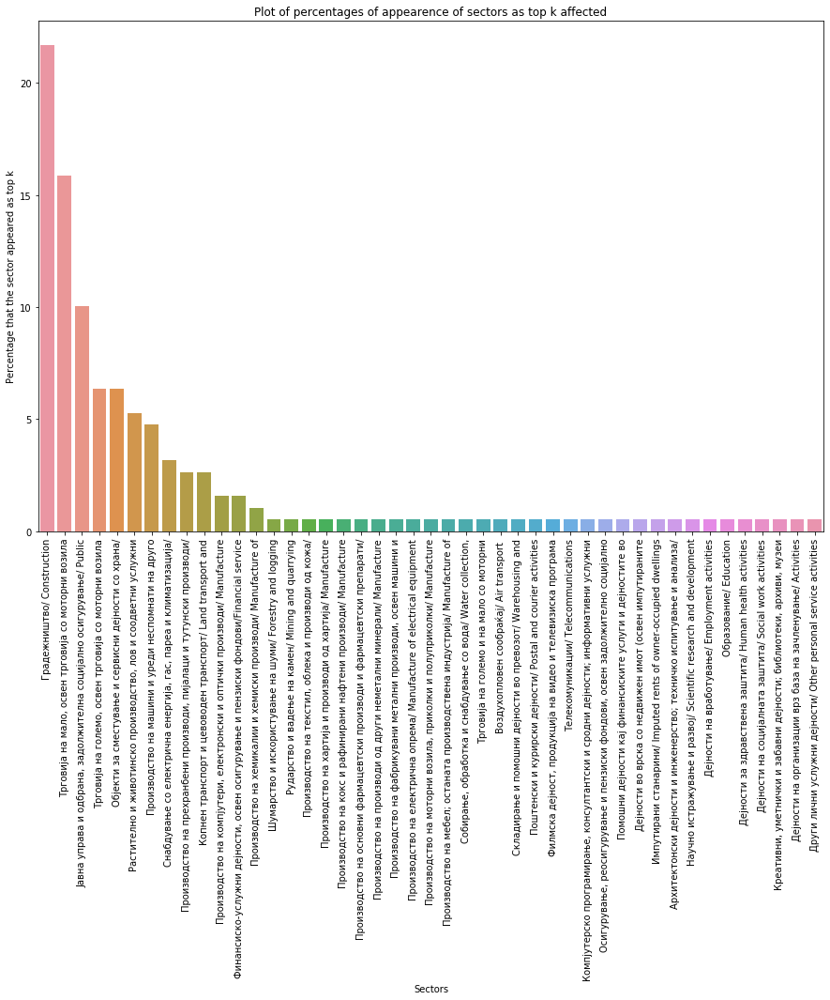

In [185]:
# Calculating the C matrix which will represent a somewhat normalized version of p excluding
# the shock and the noise (both are nullified). I also analyze and visualize the top k=3 sectors that appear as most
# affected.

visualizer.visualize_describe_top_k_sectors_affection_from_C(f_columns)